In [ ]:
import csv
import cv2
import pytesseract
from pytesseract import image_to_string
import pandas as pd
import re
import os
import numpy as np
from moviepy.video.io.VideoFileClip import VideoFileClip
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
%run helper-extractingVideos.ipynb

In [ ]:
def extract_from_video(filePath,videoName,template,templateRes , template2 , template3 , template4):
        # Open the video using OpenCV

    desired_width = 1631
    desired_height = 907
    cap = cv2.VideoCapture(filePath)
    #,apiPreference=cv2.CAP_ANY,params=[
    #cv2.CAP_PROP_FRAME_WIDTH,desired_width ,
    #cv2.CAP_PROP_FRAME_HEIGHT, desired_height])

    #cap.set(cv2.CAP_PROP_FRAME_WIDTH, desired_width)
    #cap.set(cv2.CAP_PROP_FRAME_HEIGHT, desired_height)
    fps=cap.get(cv2.CAP_PROP_FPS)
    print("FPS:",fps)
    minToSkip=11
    framesToSkip=fps*60*minToSkip
    framesToSkipEverySec=fps-1
    currentFrame=0
    currentFrameInSec=0
    jumpStarted=False
    sno=1
    prevName = ""
    row={}#changed

    # Initialize a list to store the scores

    print("start")

    oldText="old"
    # Process each frame of the video
    while True:
        # Read the next frame
        ret, frame = cap.read()
        currentFrame+=1
        currentFrameInSec+=1
        if currentFrame<framesToSkip :
            if currentFrame%(fps*60)==0:
                print(currentFrame//(fps*60) ," min(s) Skipped")
            continue
        if currentFrame//(fps*60)<minToSkip:
            continue
        if currentFrameInSec<framesToSkipEverySec:
            continue



        # Break the loop if the video has ended
        if not ret:
            print("completed")
            break

        current_pos = cap.get(cv2.CAP_PROP_POS_MSEC)
        total_seconds = int(current_pos // 1000)
        minutes = total_seconds // 60
        seconds = total_seconds % 60
        timeInVideo =f"{minutes} minutes and {seconds} seconds"
        # Convert the frame to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        text = image_to_string(gray,lang="eng")

        words = text.lower().split()  # split the text into a list of words
        filtered_words = [word for word in words if (word != 'olympic' and word != 'olympic' and word!='2020' and word!='202' and word!='tokyo' and word!='tokyo2020' and word!="tok" and word!="toky") ]  # use list comprehension to remove the word "hello"
        text = ' '.join(filtered_words)  # join the remaining words back into a string


        if not jumpStarted and 'attempt' in text.lower(): #and extract_frame(frame,template):
            prevName = extract_text_from_roi2(frame)
            prevName = clean_string(prevName)
            print(prevName)
            jumpStarted = True
            row['Time'] = timeInVideo
            print(timeInVideo," jump started")
            if 'Time' in row:  # Check if 'Time' key exists in row
                # Extract minutes and seconds from time duration string                    time_str = row['Time']
                time_str = row['Time']
                minutes_str, seconds_str = re.match(r'(\d+) minutes and (\d+) seconds', time_str).groups()
                # Convert minutes and seconds to integers
                minutes = int(minutes_str)
                seconds = int(seconds_str)
                # Calculate total seconds
                totalSeconds = minutes * 60 + seconds


        if not jumpStarted  and len(text)>0 and extract_frame(frame,templateRes) :
            prevName = extract_text_from_roi(frame)
            prevName = clean_string(prevName)
            if len(prevName)>5:
                print(prevName)
                jumpStarted = True
                row['Time'] = timeInVideo
                print(timeInVideo," jump started")
                if 'Time' in row:  # Check if 'Time' key exists in row
                    # Extract minutes and seconds from time duration string                    time_str = row['Time']
                    time_str = row['Time']
                    minutes_str, seconds_str = re.match(r'(\d+) minutes and (\d+) seconds', time_str).groups()
                    # Convert minutes and seconds to integers
                    minutes = int(minutes_str)
                    seconds = int(seconds_str)
                    # Calculate total seconds
                    totalSeconds = minutes * 60 + seconds
                #chatgpt write code here to skip video for 7sec
                #new_total_seconds = total_seconds + 7
                #new_minutes = new_total_seconds // 60
                #new_seconds = new_total_seconds % 60
                #timeInVideo = f"{new_minutes} minutes and {new_seconds} seconds"
                for i in range(int(7*fps)):
                    ret,frame = cap.read()
                    currentFrame+=1
                    current_pos = cap.get(cv2.CAP_PROP_POS_MSEC)
                    total_seconds = int(current_pos // 1000)
                    minutes = total_seconds // 60
                    seconds = total_seconds % 60
                    timeInVideo =f"{minutes} minutes and {seconds} seconds"



        if jumpStarted  and len(text)>0 and extract_frame(frame,templateRes) :
            nameOfJumper = extract_text_from_roi(frame)
            nameOfJumper = clean_string(nameOfJumper)
            print(nameOfJumper)
            sim_score = similarity_score(nameOfJumper,prevName)
            print("prev name: "+prevName+" new name : "+ nameOfJumper+" sim score : "+str(sim_score))
            if sim_score > 0.5:
                jumpStarted = False
                print(timeInVideo," jump scores announced")
                #plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
                extract_clip(filePath,'ExtractedVideos/'+str(sno)+'_'+videoName+'.mp4',totalSeconds,int(total_seconds))
                sno+=1                #print(text)
                print(row)
                #save_data(row,"scores")
                #chatgpt write code here to skip video for 7sec
                #new_total_seconds = total_seconds + 7
                #new_minutes = new_total_seconds // 60
                #ew_seconds = new_total_seconds % 60
                #timeInVideo = f"{new_minutes} minutes and {new_seconds} seconds"
                for i in range(int(7*fps)):
                    ret,frame = cap.read()
                    currentFrame+=1
                    current_pos = cap.get(cv2.CAP_PROP_POS_MSEC)
                    total_seconds = int(current_pos // 1000)
                    minutes = total_seconds // 60
                    seconds = total_seconds % 60
                    timeInVideo =f"{minutes} minutes and {seconds} seconds"
            elif len(nameOfJumper) > 10:
                print("similarity score < 0.5 assuming this as start" + " name of jumper : "+nameOfJumper + " time : " + timeInVideo)
                jumpStarted = True
                prevName = nameOfJumper
                row['Time'] = timeInVideo
                print(timeInVideo," jump started")
                if 'Time' in row:  # Check if 'Time' key exists in row
                    # Extract minutes and seconds from time duration string                    time_str = row['Time']
                    time_str = row['Time']
                    minutes_str, seconds_str = re.match(r'(\d+) minutes and (\d+) seconds', time_str).groups()
                    # Convert minutes and seconds to integers
                    minutes = int(minutes_str)
                    seconds = int(seconds_str)
                    # Calculate total seconds
                    totalSeconds = minutes * 60 + seconds
                for i in range(int(7*fps)):
                    ret,frame = cap.read()
                    currentFrame+=1
                    current_pos = cap.get(cv2.CAP_PROP_POS_MSEC)
                    total_seconds = int(current_pos // 1000)
                    minutes = total_seconds // 60
                    seconds = total_seconds % 60
                    timeInVideo =f"{minutes} minutes and {seconds} seconds"





        currentFrameInSec=0
    cap.release()

FPS: 29.97
start


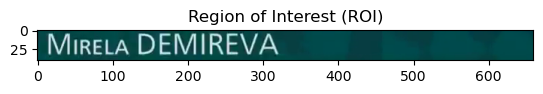

miretademireva
11 minutes and 12 seconds  jump started


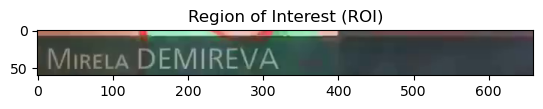

miretademireva
prev name: miretademireva new name : miretademireva sim score : 1.0
11 minutes and 33 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/1_Women's_High_Jump_Final_Tokyo_Replays.mp4
672
693
Moviepy - Building video ExtractedVideos/1_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 1_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/1_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/1_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '11 minutes and 12 seconds'}


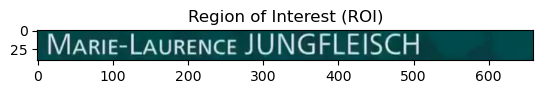

marielaurrencejungfleisch
11 minutes and 49 seconds  jump started


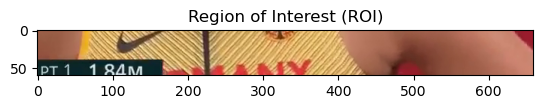


prev name: marielaurrencejungfleisch new name :  sim score : 0.0


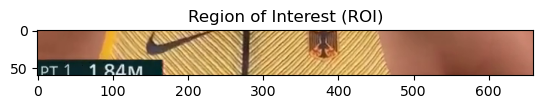

yyptbw
prev name: marielaurrencejungfleisch new name : yyptbw sim score : 0.0


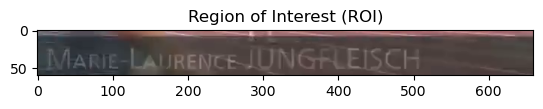

mariclaurencejungfleisch
prev name: marielaurrencejungfleisch new name : mariclaurencejungfleisch sim score : 0.92
12 minutes and 25 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/2_Women's_High_Jump_Final_Tokyo_Replays.mp4
709
745
Moviepy - Building video ExtractedVideos/2_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 2_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/2_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/2_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '11 minutes and 49 seconds'}


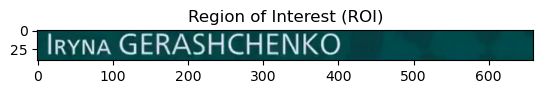

iryynagerashchenko
12 minutes and 35 seconds  jump started


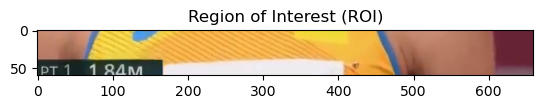


prev name: iryynagerashchenko new name :  sim score : 0.0


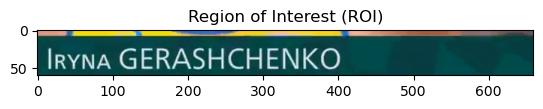

iryynagerashchenko
prev name: iryynagerashchenko new name : iryynagerashchenko sim score : 1.0
13 minutes and 11 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/3_Women's_High_Jump_Final_Tokyo_Replays.mp4
755
791
Moviepy - Building video ExtractedVideos/3_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 3_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/3_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/3_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '12 minutes and 35 seconds'}


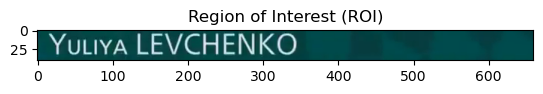

yuuiyaalevchenko
13 minutes and 22 seconds  jump started


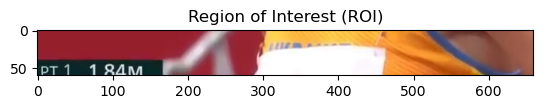

ptana
prev name: yuuiyaalevchenko new name : ptana sim score : 0.125


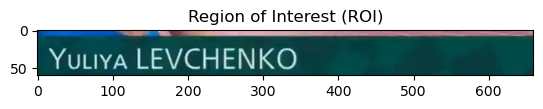

yuurvalevchenko
prev name: yuuiyaalevchenko new name : yuurvalevchenko sim score : 0.8125
13 minutes and 55 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/4_Women's_High_Jump_Final_Tokyo_Replays.mp4
802
835
Moviepy - Building video ExtractedVideos/4_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 4_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/4_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/4_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '13 minutes and 22 seconds'}


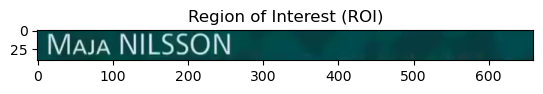

masanilsson
14 minutes and 6 seconds  jump started


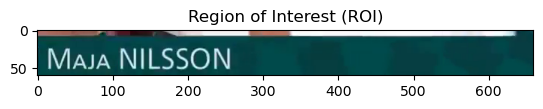

maganilsson
prev name: masanilsson new name : maganilsson sim score : 0.9090909090909091
14 minutes and 37 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/5_Women's_High_Jump_Final_Tokyo_Replays.mp4
846
877
Moviepy - Building video ExtractedVideos/5_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 5_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/5_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/5_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '14 minutes and 6 seconds'}


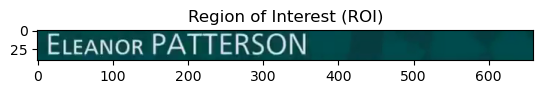

eleanorpatterson
14 minutes and 50 seconds  jump started


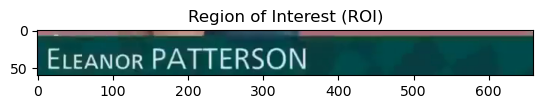

eleanorpatterson
prev name: eleanorpatterson new name : eleanorpatterson sim score : 1.0
15 minutes and 12 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/6_Women's_High_Jump_Final_Tokyo_Replays.mp4
890
912
Moviepy - Building video ExtractedVideos/6_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 6_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/6_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/6_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '14 minutes and 50 seconds'}


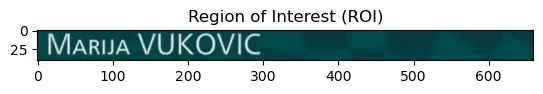

maruavukovic
15 minutes and 20 seconds  jump started


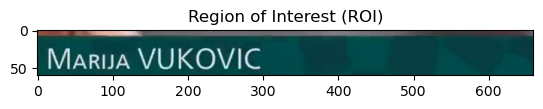

maruavukovic
prev name: maruavukovic new name : maruavukovic sim score : 1.0
15 minutes and 49 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/7_Women's_High_Jump_Final_Tokyo_Replays.mp4
920
949
Moviepy - Building video ExtractedVideos/7_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 7_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/7_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/7_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '15 minutes and 20 seconds'}


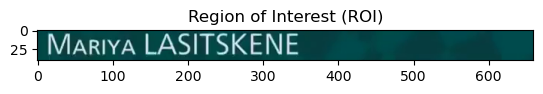

mariyalasitskene
16 minutes and 1 seconds  jump started


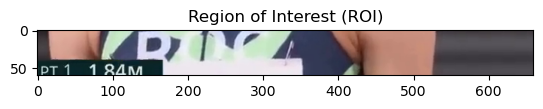

pteyme
prev name: mariyalasitskene new name : pteyme sim score : 0.125


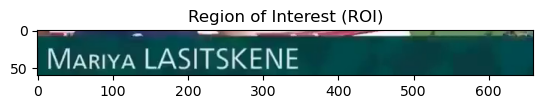

maarivalasitskene
prev name: mariyalasitskene new name : maarivalasitskene sim score : 0.8823529411764706
16 minutes and 36 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/8_Women's_High_Jump_Final_Tokyo_Replays.mp4
961
996
Moviepy - Building video ExtractedVideos/8_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 8_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/8_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/8_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '16 minutes and 1 seconds'}


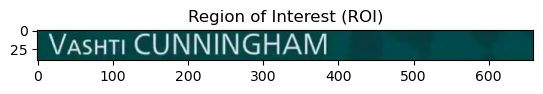

vastcunningham
16 minutes and 50 seconds  jump started


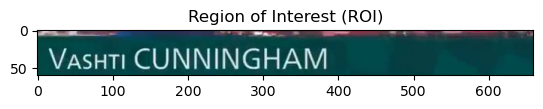

vasutcunningham
prev name: vastcunningham new name : vasutcunningham sim score : 0.9333333333333333
17 minutes and 23 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/9_Women's_High_Jump_Final_Tokyo_Replays.mp4
1010
1043
Moviepy - Building video ExtractedVideos/9_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 9_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/9_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/9_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '16 minutes and 50 seconds'}


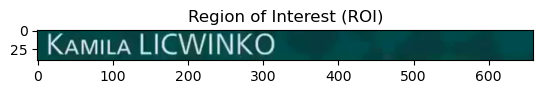

kamitalicwinko
17 minutes and 33 seconds  jump started


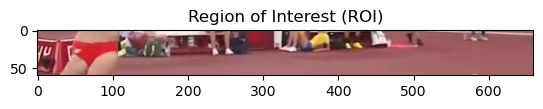

leeeppeeegp
prev name: kamitalicwinko new name : leeeppeeegp sim score : 0.0
similarity score < 0.5 assuming this as start name of jumper : leeeppeeegp time : 18 minutes and 0 seconds
18 minutes and 0 seconds  jump started


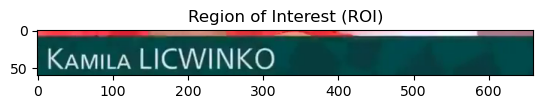

eesskamitalicwinko
prev name: leeeppeeegp new name : eesskamitalicwinko sim score : 0.05555555555555558
similarity score < 0.5 assuming this as start name of jumper : eesskamitalicwinko time : 18 minutes and 8 seconds
18 minutes and 8 seconds  jump started


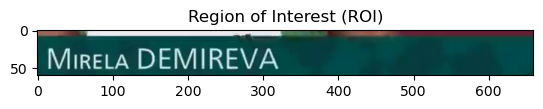

miretademireva
prev name: eesskamitalicwinko new name : miretademireva sim score : 0.11111111111111116
similarity score < 0.5 assuming this as start name of jumper : miretademireva time : 18 minutes and 27 seconds
18 minutes and 27 seconds  jump started


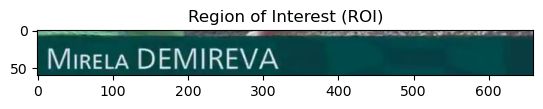

miretademirevaa
prev name: miretademireva new name : miretademirevaa sim score : 0.9333333333333333
19 minutes and 6 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/10_Women's_High_Jump_Final_Tokyo_Replays.mp4
1107
1146
Moviepy - Building video ExtractedVideos/10_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 10_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/10_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/10_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '18 minutes and 27 seconds'}


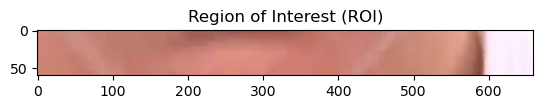

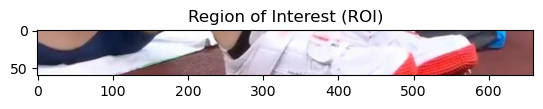

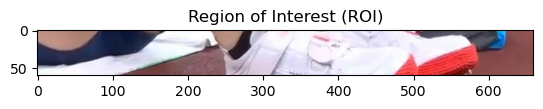

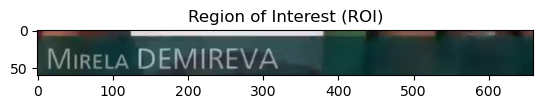

miretademireva
22 minutes and 25 seconds  jump started


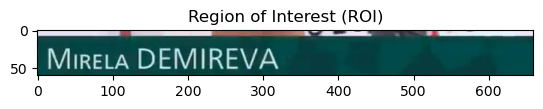

miretademireva
prev name: miretademireva new name : miretademireva sim score : 1.0
22 minutes and 57 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/11_Women's_High_Jump_Final_Tokyo_Replays.mp4
1345
1377
Moviepy - Building video ExtractedVideos/11_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 11_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/11_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/11_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '22 minutes and 25 seconds'}


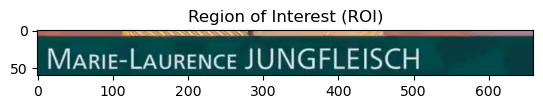

marielaurencejungfleisch
23 minutes and 25 seconds  jump started


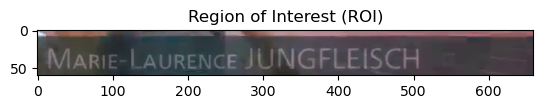

mariclaurencejungfleisch
prev name: marielaurencejungfleisch new name : mariclaurencejungfleisch sim score : 0.9583333333333334
24 minutes and 0 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/12_Women's_High_Jump_Final_Tokyo_Replays.mp4
1405
1440
Moviepy - Building video ExtractedVideos/12_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 12_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/12_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/12_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '23 minutes and 25 seconds'}


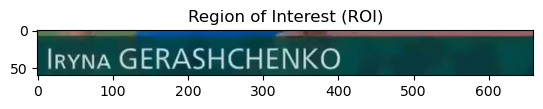

irynagerashchenko
24 minutes and 42 seconds  jump started


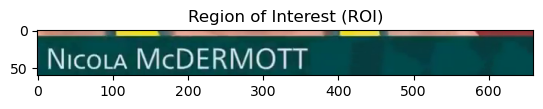

nicotamcdermott
prev name: irynagerashchenko new name : nicotamcdermott sim score : 0.17647058823529416
similarity score < 0.5 assuming this as start name of jumper : nicotamcdermott time : 24 minutes and 55 seconds
24 minutes and 55 seconds  jump started


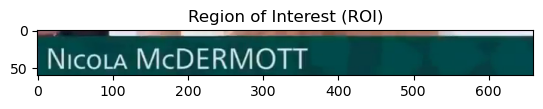

nicotamcdermott
prev name: nicotamcdermott new name : nicotamcdermott sim score : 1.0
25 minutes and 25 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/13_Women's_High_Jump_Final_Tokyo_Replays.mp4
1495
1525
Moviepy - Building video ExtractedVideos/13_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 13_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/13_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/13_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '24 minutes and 55 seconds'}


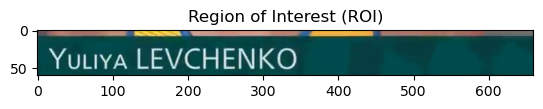

yutiyalevchenko
25 minutes and 37 seconds  jump started


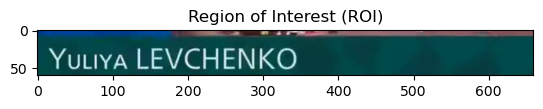

aosoeyutivalevchenko
prev name: yutiyalevchenko new name : aosoeyutivalevchenko sim score : 0.7
26 minutes and 14 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/14_Women's_High_Jump_Final_Tokyo_Replays.mp4
1537
1574
Moviepy - Building video ExtractedVideos/14_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 14_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/14_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/14_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '25 minutes and 37 seconds'}


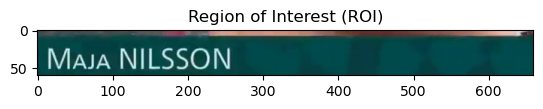

mayanilsson
27 minutes and 32 seconds  jump started


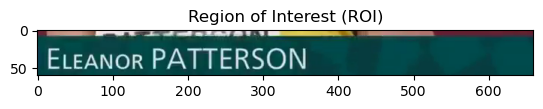

eleeanorpatterson
prev name: mayanilsson new name : eleeanorpatterson sim score : 0.2941176470588235
similarity score < 0.5 assuming this as start name of jumper : eleeanorpatterson time : 28 minutes and 10 seconds
28 minutes and 10 seconds  jump started


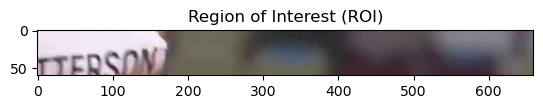


prev name: eleeanorpatterson new name :  sim score : 0.0


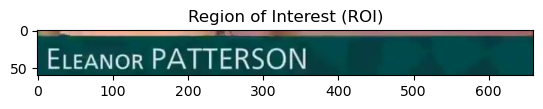

eleaworpatterson
prev name: eleeanorpatterson new name : eleaworpatterson sim score : 0.8823529411764706
28 minutes and 33 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/15_Women's_High_Jump_Final_Tokyo_Replays.mp4
1690
1713
Moviepy - Building video ExtractedVideos/15_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 15_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/15_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/15_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '28 minutes and 10 seconds'}


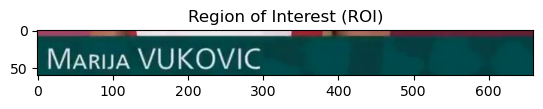

maruavukovic
28 minutes and 44 seconds  jump started


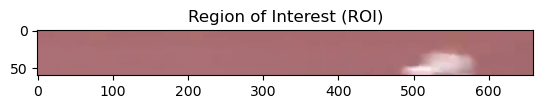


prev name: maruavukovic new name :  sim score : 0.0


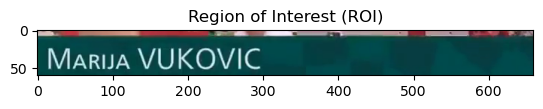

maruavukovic
prev name: maruavukovic new name : maruavukovic sim score : 1.0
29 minutes and 11 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/16_Women's_High_Jump_Final_Tokyo_Replays.mp4
1724
1751
Moviepy - Building video ExtractedVideos/16_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 16_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/16_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/16_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '28 minutes and 44 seconds'}


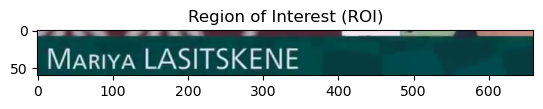

marivalasitskene
29 minutes and 28 seconds  jump started


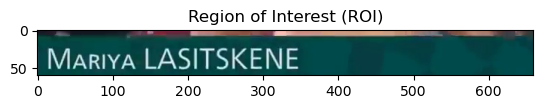

mariyalasitskene
prev name: marivalasitskene new name : mariyalasitskene sim score : 0.9375
30 minutes and 2 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/17_Women's_High_Jump_Final_Tokyo_Replays.mp4
1768
1802
Moviepy - Building video ExtractedVideos/17_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 17_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/17_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/17_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '29 minutes and 28 seconds'}


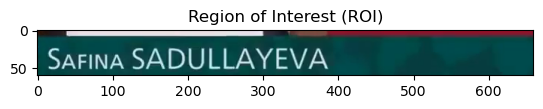

safinasadullayeva
30 minutes and 43 seconds  jump started


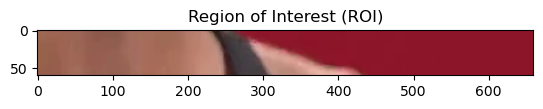


prev name: safinasadullayeva new name :  sim score : 0.0


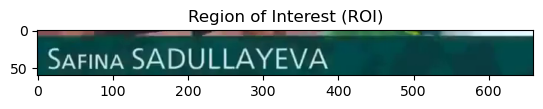

epariasadullayeva
prev name: safinasadullayeva new name : epariasadullayeva sim score : 0.7647058823529411
31 minutes and 13 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/18_Women's_High_Jump_Final_Tokyo_Replays.mp4
1843
1873
Moviepy - Building video ExtractedVideos/18_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 18_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/18_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/18_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '30 minutes and 43 seconds'}


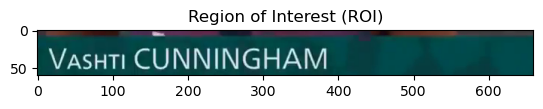

vasuticunningham
31 minutes and 29 seconds  jump started


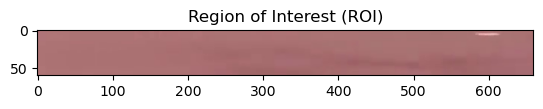


prev name: vasuticunningham new name :  sim score : 0.0


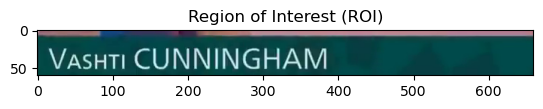

vastcunningham
prev name: vasuticunningham new name : vastcunningham sim score : 0.875
31 minutes and 53 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/19_Women's_High_Jump_Final_Tokyo_Replays.mp4
1889
1913
Moviepy - Building video ExtractedVideos/19_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 19_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/19_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/19_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '31 minutes and 29 seconds'}


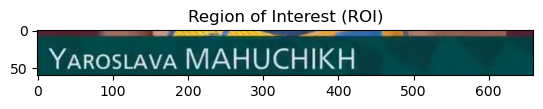

yarostavamahuchikh
32 minutes and 3 seconds  jump started


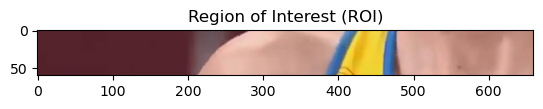


prev name: yarostavamahuchikh new name :  sim score : 0.0


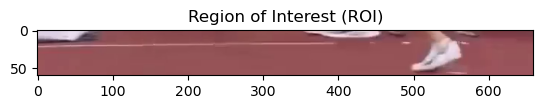


prev name: yarostavamahuchikh new name :  sim score : 0.0


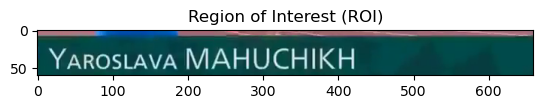

yarostavamahuchikh
prev name: yarostavamahuchikh new name : yarostavamahuchikh sim score : 1.0
32 minutes and 30 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/20_Women's_High_Jump_Final_Tokyo_Replays.mp4
1923
1950
Moviepy - Building video ExtractedVideos/20_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 20_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/20_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/20_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '32 minutes and 3 seconds'}


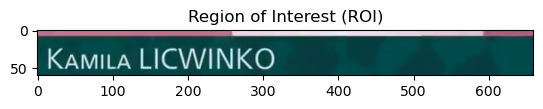

kamitalicwinko
33 minutes and 20 seconds  jump started


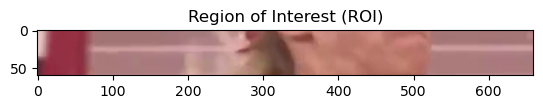


prev name: kamitalicwinko new name :  sim score : 0.0


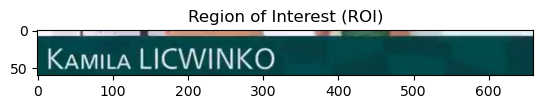

kamitalicwinko
prev name: kamitalicwinko new name : kamitalicwinko sim score : 1.0
33 minutes and 51 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/21_Women's_High_Jump_Final_Tokyo_Replays.mp4
2000
2031
Moviepy - Building video ExtractedVideos/21_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 21_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/21_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/21_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '33 minutes and 20 seconds'}


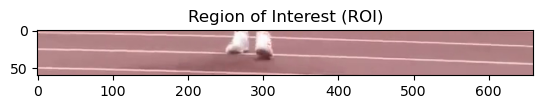

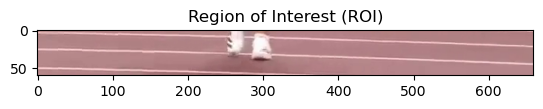

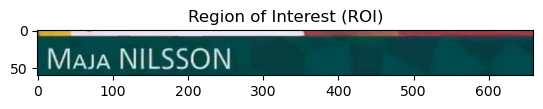

majanilsson
34 minutes and 26 seconds  jump started


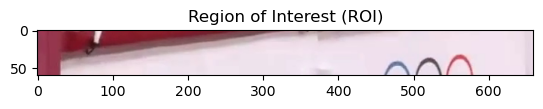

plhs
prev name: majanilsson new name : plhs sim score : 0.18181818181818177


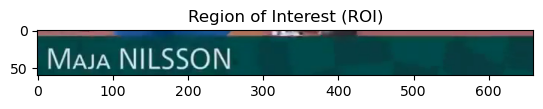

maganilsson
prev name: majanilsson new name : maganilsson sim score : 0.9090909090909091
35 minutes and 6 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/22_Women's_High_Jump_Final_Tokyo_Replays.mp4
2066
2106
Moviepy - Building video ExtractedVideos/22_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 22_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/22_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/22_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '34 minutes and 26 seconds'}


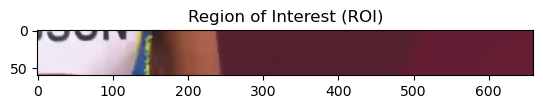

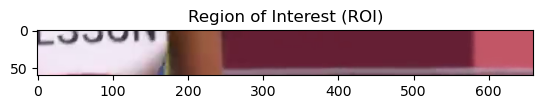

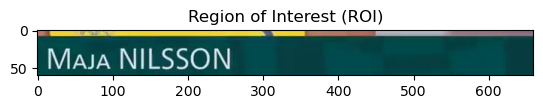

mayanilsson
36 minutes and 26 seconds  jump started


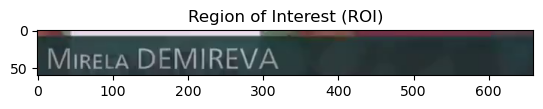

miretademireva
prev name: mayanilsson new name : miretademireva sim score : 0.1428571428571429
similarity score < 0.5 assuming this as start name of jumper : miretademireva time : 38 minutes and 59 seconds
38 minutes and 59 seconds  jump started


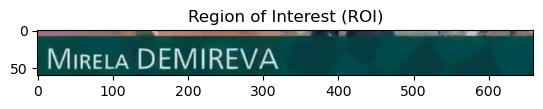

miretademireva
prev name: miretademireva new name : miretademireva sim score : 1.0
39 minutes and 32 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/23_Women's_High_Jump_Final_Tokyo_Replays.mp4
2339
2372
Moviepy - Building video ExtractedVideos/23_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 23_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/23_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/23_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '38 minutes and 59 seconds'}


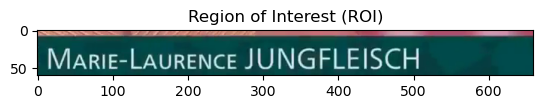

marielaurencejungfleisch
40 minutes and 12 seconds  jump started


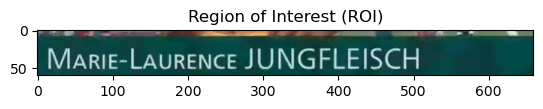

ewssaaasamarielaurencejungfleisch
prev name: marielaurencejungfleisch new name : ewssaaasamarielaurencejungfleisch sim score : 0.7272727272727273
40 minutes and 42 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/24_Women's_High_Jump_Final_Tokyo_Replays.mp4
2412
2442
Moviepy - Building video ExtractedVideos/24_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 24_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/24_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/24_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '40 minutes and 12 seconds'}


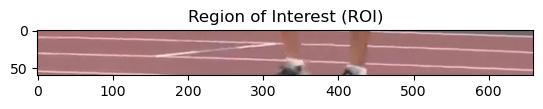

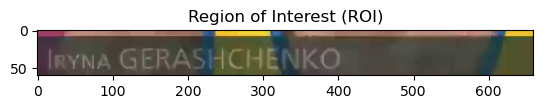

inynagerashchenko
41 minutes and 11 seconds  jump started


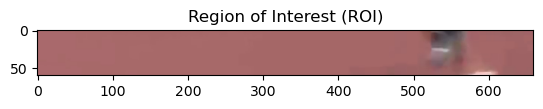


prev name: inynagerashchenko new name :  sim score : 0.0


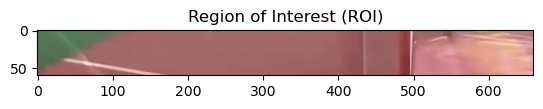


prev name: inynagerashchenko new name :  sim score : 0.0


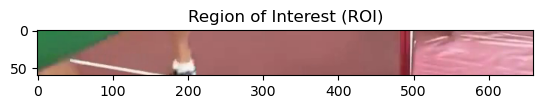


prev name: inynagerashchenko new name :  sim score : 0.0


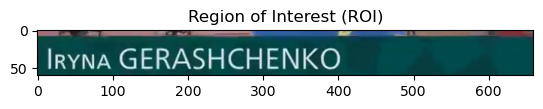

assirynagerashchenko
prev name: inynagerashchenko new name : assirynagerashchenko sim score : 0.8
41 minutes and 46 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/25_Women's_High_Jump_Final_Tokyo_Replays.mp4
2471
2506
Moviepy - Building video ExtractedVideos/25_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 25_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/25_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/25_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '41 minutes and 11 seconds'}


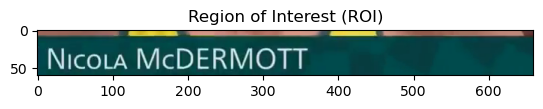

nicotamcdermott
42 minutes and 26 seconds  jump started


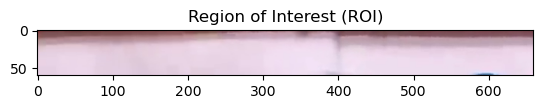


prev name: nicotamcdermott new name :  sim score : 0.0


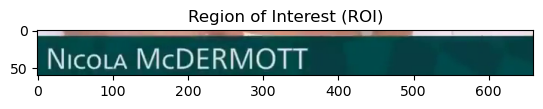

nicoramcdermott
prev name: nicotamcdermott new name : nicoramcdermott sim score : 0.9333333333333333
43 minutes and 3 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/26_Women's_High_Jump_Final_Tokyo_Replays.mp4
2546
2583
Moviepy - Building video ExtractedVideos/26_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 26_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/26_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/26_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '42 minutes and 26 seconds'}


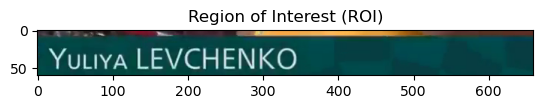

yutivalevchenko
43 minutes and 45 seconds  jump started


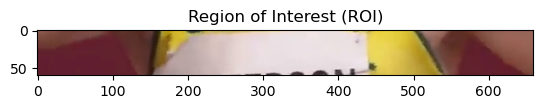


prev name: yutivalevchenko new name :  sim score : 0.0


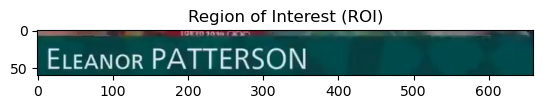

aaaeeleanorpatterson
prev name: yutivalevchenko new name : aaaeeleanorpatterson sim score : 0.15000000000000002
similarity score < 0.5 assuming this as start name of jumper : aaaeeleanorpatterson time : 44 minutes and 44 seconds
44 minutes and 44 seconds  jump started


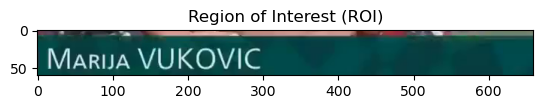

maruavukovicee
prev name: aaaeeleanorpatterson new name : maruavukovicee sim score : 0.15000000000000002
similarity score < 0.5 assuming this as start name of jumper : maruavukovicee time : 45 minutes and 37 seconds
45 minutes and 37 seconds  jump started


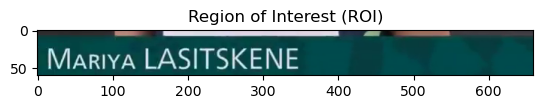

mariyalasitskene
prev name: maruavukovicee new name : mariyalasitskene sim score : 0.375
similarity score < 0.5 assuming this as start name of jumper : mariyalasitskene time : 46 minutes and 1 seconds
46 minutes and 1 seconds  jump started


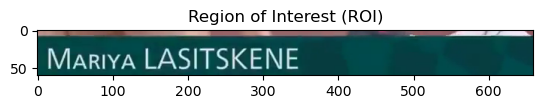

mariyalasitskene
prev name: mariyalasitskene new name : mariyalasitskene sim score : 1.0
46 minutes and 48 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/27_Women's_High_Jump_Final_Tokyo_Replays.mp4
2761
2808
Moviepy - Building video ExtractedVideos/27_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 27_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/27_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/27_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '46 minutes and 1 seconds'}


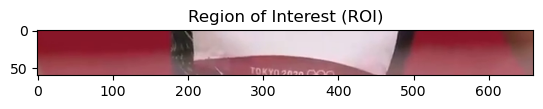

natoxvnate
47 minutes and 4 seconds  jump started


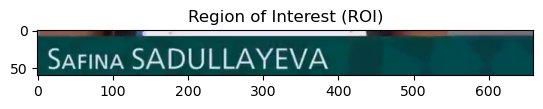

safinasadullayeva
prev name: natoxvnate new name : safinasadullayeva sim score : 0.23529411764705888
similarity score < 0.5 assuming this as start name of jumper : safinasadullayeva time : 47 minutes and 16 seconds
47 minutes and 16 seconds  jump started


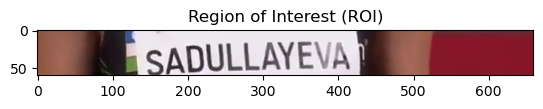

adullayeva
prev name: safinasadullayeva new name : adullayeva sim score : 0.5882352941176471
47 minutes and 24 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/28_Women's_High_Jump_Final_Tokyo_Replays.mp4
2836
2844
Moviepy - Building video ExtractedVideos/28_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 28_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/28_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/28_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '47 minutes and 16 seconds'}


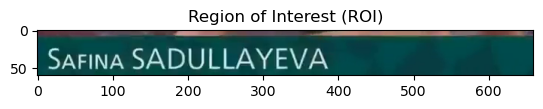

safinasadullayeva
48 minutes and 1 seconds  jump started


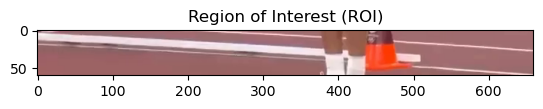


prev name: safinasadullayeva new name :  sim score : 0.0


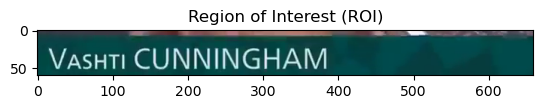

vashuticunningham
prev name: safinasadullayeva new name : vashuticunningham sim score : 0.11764705882352944
similarity score < 0.5 assuming this as start name of jumper : vashuticunningham time : 48 minutes and 48 seconds
48 minutes and 48 seconds  jump started


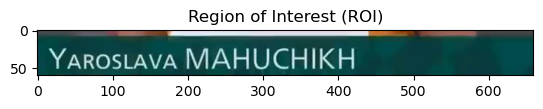

yarostavamahuchikh
prev name: vashuticunningham new name : yarostavamahuchikh sim score : 0.16666666666666663
similarity score < 0.5 assuming this as start name of jumper : yarostavamahuchikh time : 48 minutes and 57 seconds
48 minutes and 57 seconds  jump started


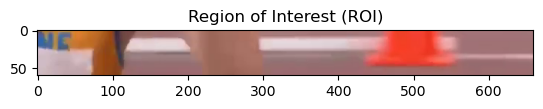


prev name: yarostavamahuchikh new name :  sim score : 0.0


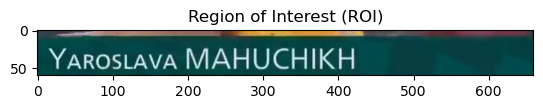

yarostavaamahuchikh
prev name: yarostavamahuchikh new name : yarostavaamahuchikh sim score : 0.9473684210526316
49 minutes and 33 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/29_Women's_High_Jump_Final_Tokyo_Replays.mp4
2937
2973
Moviepy - Building video ExtractedVideos/29_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 29_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/29_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/29_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '48 minutes and 57 seconds'}


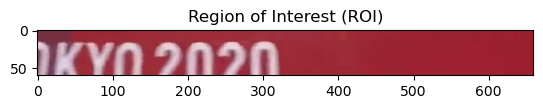

mynnenn
49 minutes and 41 seconds  jump started


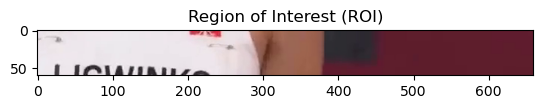


prev name: mynnenn new name :  sim score : 0.0


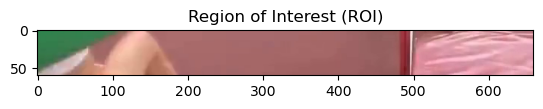


prev name: mynnenn new name :  sim score : 0.0


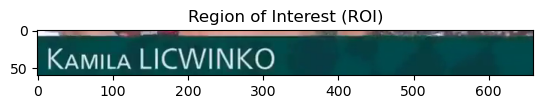

kamitalicwinkoee
prev name: mynnenn new name : kamitalicwinkoee sim score : 0.125
similarity score < 0.5 assuming this as start name of jumper : kamitalicwinkoee time : 50 minutes and 48 seconds
50 minutes and 48 seconds  jump started


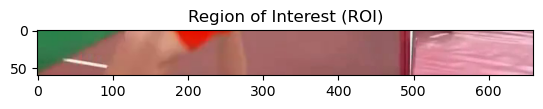


prev name: kamitalicwinkoee new name :  sim score : 0.0


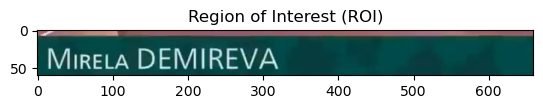

miretademireva
prev name: kamitalicwinkoee new name : miretademireva sim score : 0.1875
similarity score < 0.5 assuming this as start name of jumper : miretademireva time : 52 minutes and 23 seconds
52 minutes and 23 seconds  jump started


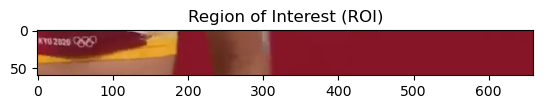

kvomgbp
prev name: miretademireva new name : kvomgbp sim score : 0.0714285714285714


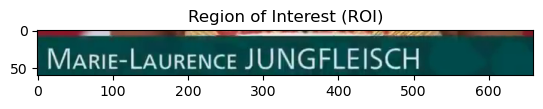

marielaurencejungfleisch
prev name: miretademireva new name : marielaurencejungfleisch sim score : 0.25
similarity score < 0.5 assuming this as start name of jumper : marielaurencejungfleisch time : 52 minutes and 45 seconds
52 minutes and 45 seconds  jump started


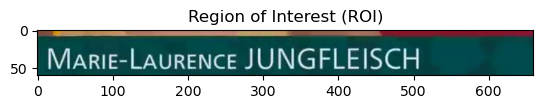

marielaurencejungfleisch
prev name: marielaurencejungfleisch new name : marielaurencejungfleisch sim score : 1.0
53 minutes and 7 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/30_Women's_High_Jump_Final_Tokyo_Replays.mp4
3165
3187
Moviepy - Building video ExtractedVideos/30_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 30_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/30_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/30_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '52 minutes and 45 seconds'}


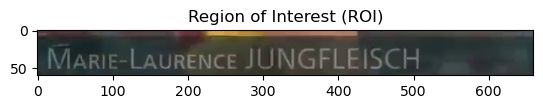

marielaurencejungfleisch
53 minutes and 36 seconds  jump started


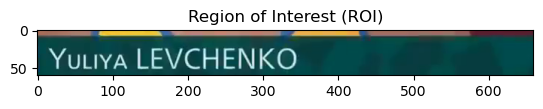

yuutyalevchenko
prev name: marielaurencejungfleisch new name : yuutyalevchenko sim score : 0.16666666666666663
similarity score < 0.5 assuming this as start name of jumper : yuutyalevchenko time : 54 minutes and 6 seconds
54 minutes and 6 seconds  jump started


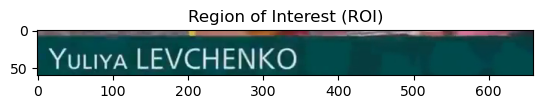

yutiyalevchenko
prev name: yuutyalevchenko new name : yutiyalevchenko sim score : 0.8666666666666667
54 minutes and 44 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/31_Women's_High_Jump_Final_Tokyo_Replays.mp4
3246
3284
Moviepy - Building video ExtractedVideos/31_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 31_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/31_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/31_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '54 minutes and 6 seconds'}


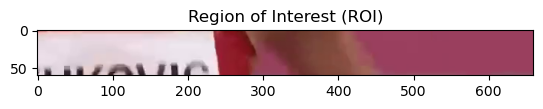

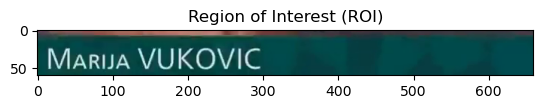

maruavukovic
55 minutes and 19 seconds  jump started


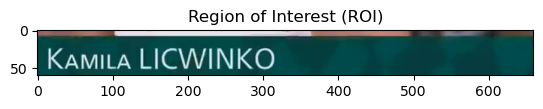

kamitalicwinko
prev name: maruavukovic new name : kamitalicwinko sim score : 0.1428571428571429
similarity score < 0.5 assuming this as start name of jumper : kamitalicwinko time : 55 minutes and 28 seconds
55 minutes and 28 seconds  jump started


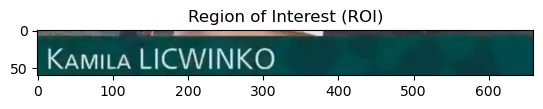

kamitalicwinko
prev name: kamitalicwinko new name : kamitalicwinko sim score : 1.0
55 minutes and 52 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/32_Women's_High_Jump_Final_Tokyo_Replays.mp4
3328
3352
Moviepy - Building video ExtractedVideos/32_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 32_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/32_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/32_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '55 minutes and 28 seconds'}


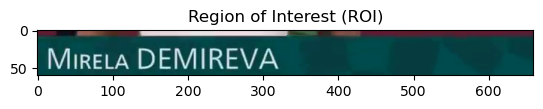

miretademireva
56 minutes and 16 seconds  jump started


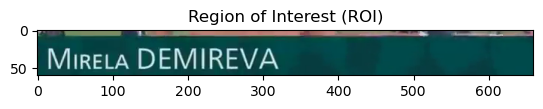

miretademireva
prev name: miretademireva new name : miretademireva sim score : 1.0
56 minutes and 47 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/33_Women's_High_Jump_Final_Tokyo_Replays.mp4
3376
3407
Moviepy - Building video ExtractedVideos/33_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 33_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/33_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/33_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '56 minutes and 16 seconds'}


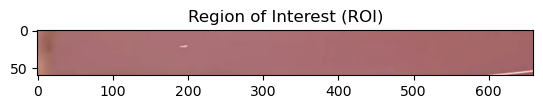

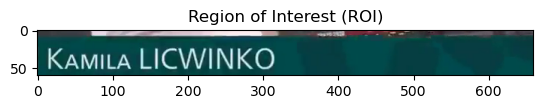

kamitalicwinko
58 minutes and 5 seconds  jump started


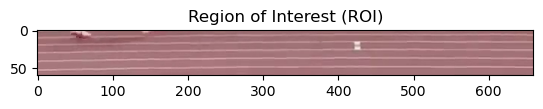


prev name: kamitalicwinko new name :  sim score : 0.0


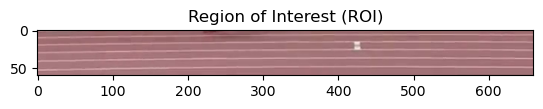


prev name: kamitalicwinko new name :  sim score : 0.0


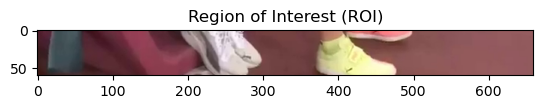


prev name: kamitalicwinko new name :  sim score : 0.0


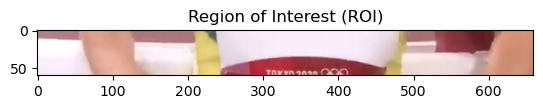


prev name: kamitalicwinko new name :  sim score : 0.0


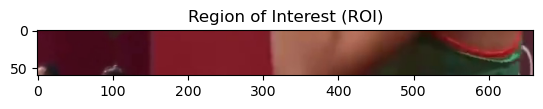


prev name: kamitalicwinko new name :  sim score : 0.0


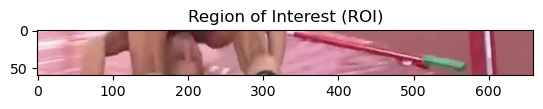


prev name: kamitalicwinko new name :  sim score : 0.0


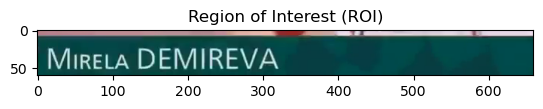

miretademireva
prev name: kamitalicwinko new name : miretademireva sim score : 0.1428571428571429
similarity score < 0.5 assuming this as start name of jumper : miretademireva time : 60 minutes and 25 seconds
60 minutes and 25 seconds  jump started


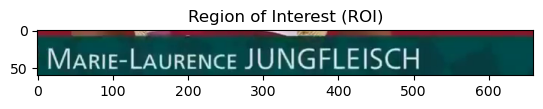

marielaurencejungfleisch
prev name: miretademireva new name : marielaurencejungfleisch sim score : 0.25
similarity score < 0.5 assuming this as start name of jumper : marielaurencejungfleisch time : 60 minutes and 35 seconds
60 minutes and 35 seconds  jump started


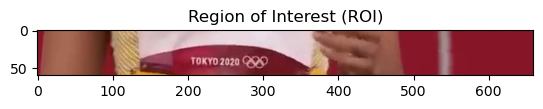

itokyq
prev name: marielaurencejungfleisch new name : itokyq sim score : 0.04166666666666663


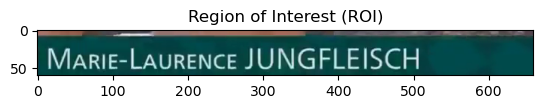

rymarielaurencejungfleisch
prev name: marielaurencejungfleisch new name : rymarielaurencejungfleisch sim score : 0.9230769230769231
61 minutes and 34 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/34_Women's_High_Jump_Final_Tokyo_Replays.mp4
3635
3694
Moviepy - Building video ExtractedVideos/34_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 34_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/34_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/34_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '60 minutes and 35 seconds'}


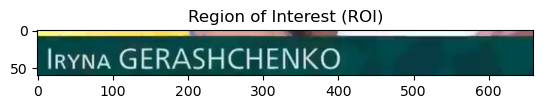

iryynagerashchenko
62 minutes and 24 seconds  jump started


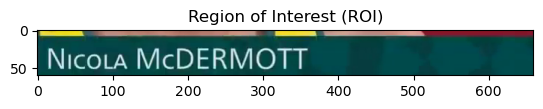

nicotamcdermott
prev name: iryynagerashchenko new name : nicotamcdermott sim score : 0.16666666666666663
similarity score < 0.5 assuming this as start name of jumper : nicotamcdermott time : 62 minutes and 33 seconds
62 minutes and 33 seconds  jump started


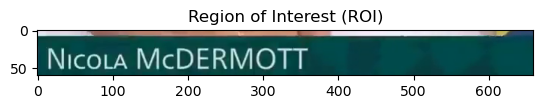

nicotamcdermott
prev name: nicotamcdermott new name : nicotamcdermott sim score : 1.0
63 minutes and 11 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/35_Women's_High_Jump_Final_Tokyo_Replays.mp4
3753
3791
Moviepy - Building video ExtractedVideos/35_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 35_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/35_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/35_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '62 minutes and 33 seconds'}


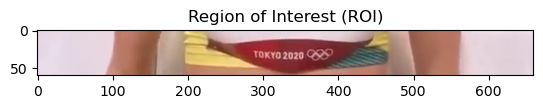

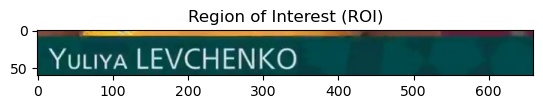

yutiyalevchenko
63 minutes and 31 seconds  jump started


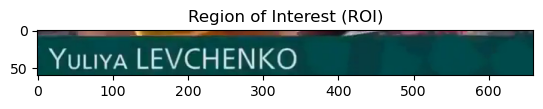

eeyutiyvalevchenko
prev name: yutiyalevchenko new name : eeyutiyvalevchenko sim score : 0.8333333333333334
64 minutes and 6 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/36_Women's_High_Jump_Final_Tokyo_Replays.mp4
3811
3846
Moviepy - Building video ExtractedVideos/36_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 36_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/36_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/36_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '63 minutes and 31 seconds'}


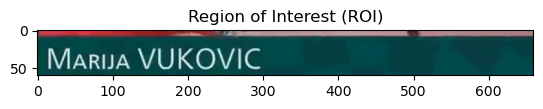

maruavukovic
65 minutes and 33 seconds  jump started


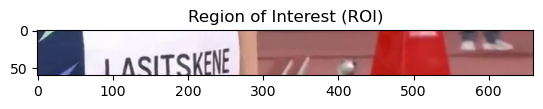


prev name: maruavukovic new name :  sim score : 0.0


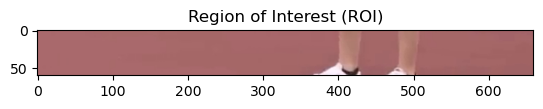


prev name: maruavukovic new name :  sim score : 0.0


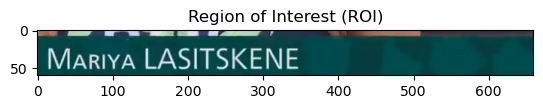

mariyalasitskeneae
prev name: maruavukovic new name : mariyalasitskeneae sim score : 0.2777777777777778
similarity score < 0.5 assuming this as start name of jumper : mariyalasitskeneae time : 67 minutes and 30 seconds
67 minutes and 30 seconds  jump started


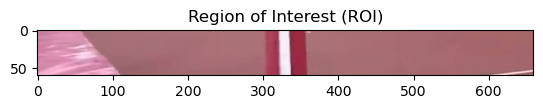


prev name: mariyalasitskeneae new name :  sim score : 0.0


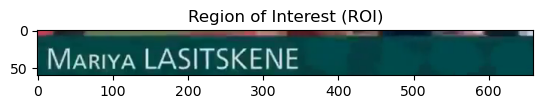

mariyalasitskene
prev name: mariyalasitskeneae new name : mariyalasitskene sim score : 0.8888888888888888
68 minutes and 10 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/37_Women's_High_Jump_Final_Tokyo_Replays.mp4
4050
4090
Moviepy - Building video ExtractedVideos/37_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 37_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/37_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/37_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '67 minutes and 30 seconds'}


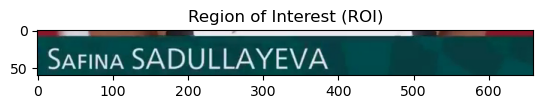

safinasadullayeva
68 minutes and 25 seconds  jump started


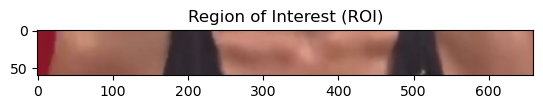


prev name: safinasadullayeva new name :  sim score : 0.0


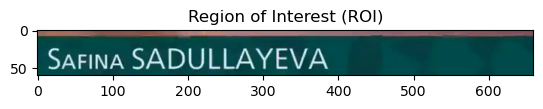

sarinasadullayeva
prev name: safinasadullayeva new name : sarinasadullayeva sim score : 0.9411764705882353
69 minutes and 8 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/38_Women's_High_Jump_Final_Tokyo_Replays.mp4
4105
4148
Moviepy - Building video ExtractedVideos/38_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 38_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/38_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/38_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '68 minutes and 25 seconds'}


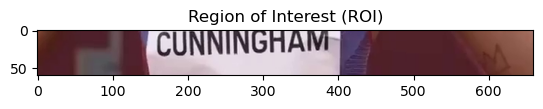

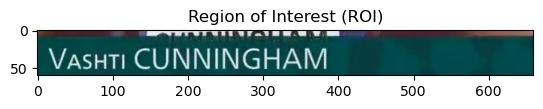

vasuticunningham
69 minutes and 17 seconds  jump started


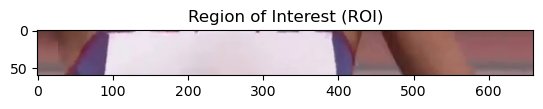


prev name: vasuticunningham new name :  sim score : 0.0


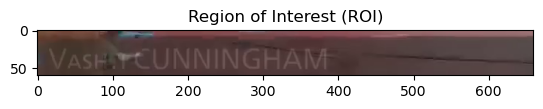

vasespcunningham
prev name: vasuticunningham new name : vasespcunningham sim score : 0.8125
69 minutes and 55 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/39_Women's_High_Jump_Final_Tokyo_Replays.mp4
4157
4195
Moviepy - Building video ExtractedVideos/39_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 39_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/39_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/39_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '69 minutes and 17 seconds'}


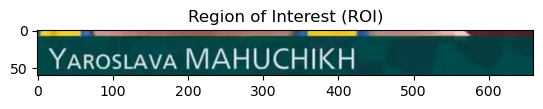

yaroslavamahuchikh
70 minutes and 8 seconds  jump started


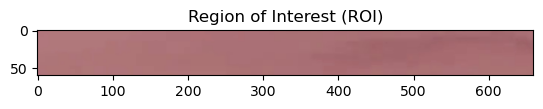


prev name: yaroslavamahuchikh new name :  sim score : 0.0


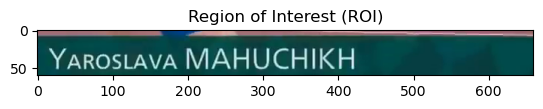

yarostavamahuchikh
prev name: yaroslavamahuchikh new name : yarostavamahuchikh sim score : 0.9444444444444444
70 minutes and 33 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/40_Women's_High_Jump_Final_Tokyo_Replays.mp4
4208
4233
Moviepy - Building video ExtractedVideos/40_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 40_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/40_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/40_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '70 minutes and 8 seconds'}


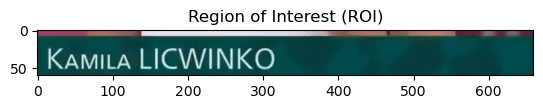

kamitalicwinko
70 minutes and 42 seconds  jump started


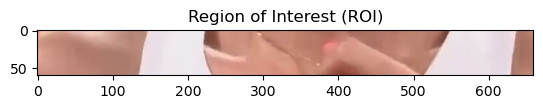


prev name: kamitalicwinko new name :  sim score : 0.0


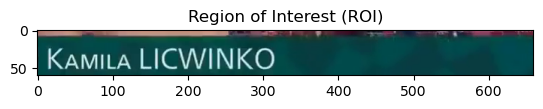

kamitalicwinko
prev name: kamitalicwinko new name : kamitalicwinko sim score : 1.0
71 minutes and 18 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/41_Women's_High_Jump_Final_Tokyo_Replays.mp4
4242
4278
Moviepy - Building video ExtractedVideos/41_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 41_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/41_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/41_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '70 minutes and 42 seconds'}


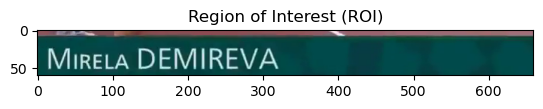

miretademireva
72 minutes and 16 seconds  jump started


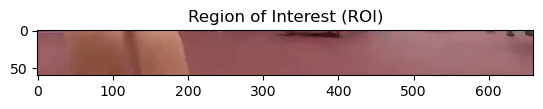


prev name: miretademireva new name :  sim score : 0.0


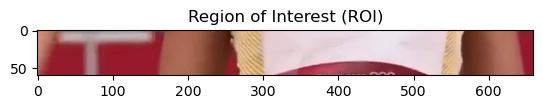


prev name: miretademireva new name :  sim score : 0.0


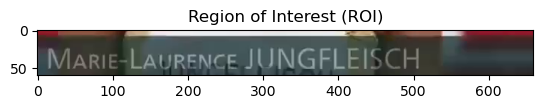

marielaurencejungfleisch
prev name: miretademireva new name : marielaurencejungfleisch sim score : 0.25
similarity score < 0.5 assuming this as start name of jumper : marielaurencejungfleisch time : 72 minutes and 38 seconds
72 minutes and 38 seconds  jump started


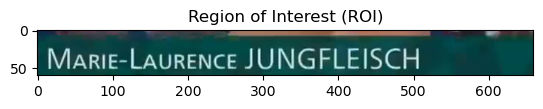

martelaurencejungfleisch
prev name: marielaurencejungfleisch new name : martelaurencejungfleisch sim score : 0.9583333333333334
73 minutes and 17 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/42_Women's_High_Jump_Final_Tokyo_Replays.mp4
4358
4397
Moviepy - Building video ExtractedVideos/42_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 42_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/42_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/42_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '72 minutes and 38 seconds'}


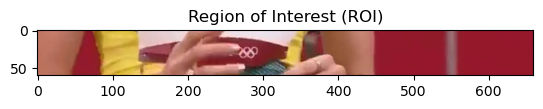

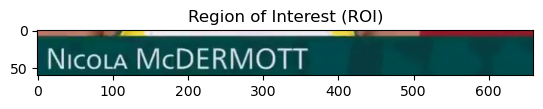

nicotamcdermott
73 minutes and 35 seconds  jump started


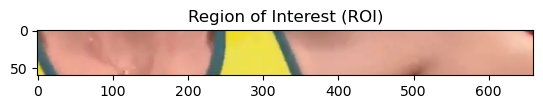


prev name: nicotamcdermott new name :  sim score : 0.0


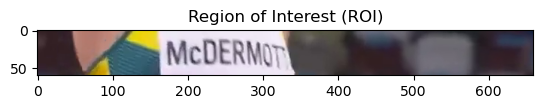


prev name: nicotamcdermott new name :  sim score : 0.0


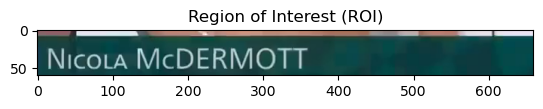

nicotamcdermott
prev name: nicotamcdermott new name : nicotamcdermott sim score : 1.0
74 minutes and 26 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/43_Women's_High_Jump_Final_Tokyo_Replays.mp4
4415
4466
Moviepy - Building video ExtractedVideos/43_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 43_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/43_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/43_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '73 minutes and 35 seconds'}


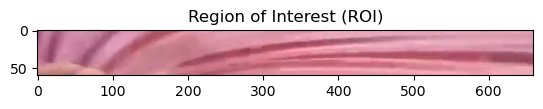

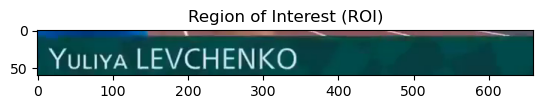

yuuiyalevchenko
75 minutes and 10 seconds  jump started


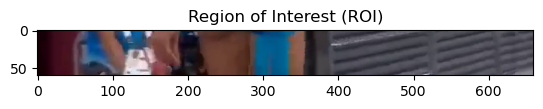


prev name: yuuiyalevchenko new name :  sim score : 0.0


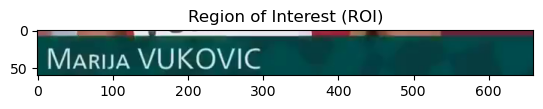

maruavukovic
prev name: yuuiyalevchenko new name : maruavukovic sim score : 0.1333333333333333
similarity score < 0.5 assuming this as start name of jumper : maruavukovic time : 75 minutes and 24 seconds
75 minutes and 24 seconds  jump started


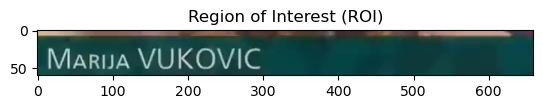

maruavukovic
prev name: maruavukovic new name : maruavukovic sim score : 1.0
75 minutes and 49 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/44_Women's_High_Jump_Final_Tokyo_Replays.mp4
4524
4549
Moviepy - Building video ExtractedVideos/44_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 44_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/44_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/44_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '75 minutes and 24 seconds'}


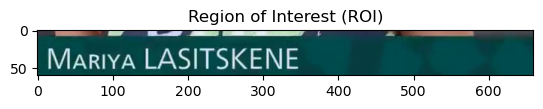

mariyalasitskene
76 minutes and 7 seconds  jump started


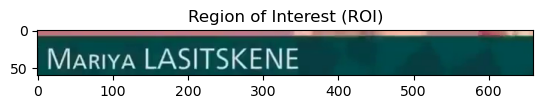

mariyalasitskene
prev name: mariyalasitskene new name : mariyalasitskene sim score : 1.0
76 minutes and 49 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/45_Women's_High_Jump_Final_Tokyo_Replays.mp4
4567
4609
Moviepy - Building video ExtractedVideos/45_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 45_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/45_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/45_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '76 minutes and 7 seconds'}


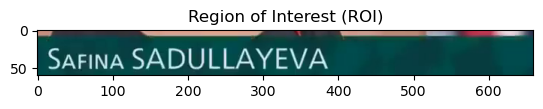

safinasadullayeva
77 minutes and 6 seconds  jump started


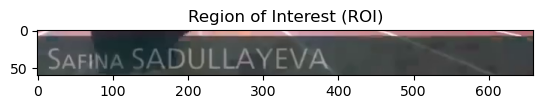

sarinasadullayeva
prev name: safinasadullayeva new name : sarinasadullayeva sim score : 0.9411764705882353
77 minutes and 43 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/46_Women's_High_Jump_Final_Tokyo_Replays.mp4
4626
4663
Moviepy - Building video ExtractedVideos/46_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 46_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/46_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/46_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '77 minutes and 6 seconds'}


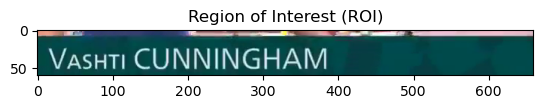

eehievasutcunningham
78 minutes and 28 seconds  jump started


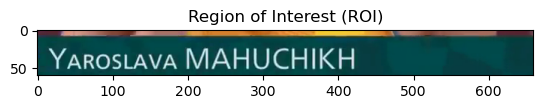

yarostavamahuchikh
prev name: eehievasutcunningham new name : yarostavamahuchikh sim score : 0.15000000000000002
similarity score < 0.5 assuming this as start name of jumper : yarostavamahuchikh time : 78 minutes and 42 seconds
78 minutes and 42 seconds  jump started


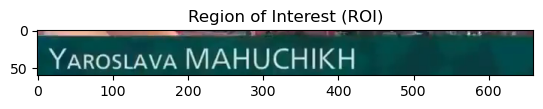

yaroslavamahuchikh
prev name: yarostavamahuchikh new name : yaroslavamahuchikh sim score : 0.9444444444444444
79 minutes and 12 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/47_Women's_High_Jump_Final_Tokyo_Replays.mp4
4722
4752
Moviepy - Building video ExtractedVideos/47_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 47_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/47_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/47_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '78 minutes and 42 seconds'}


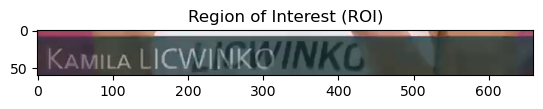

kamitalicwink
79 minutes and 25 seconds  jump started


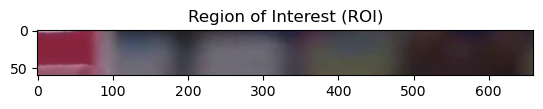


prev name: kamitalicwink new name :  sim score : 0.0


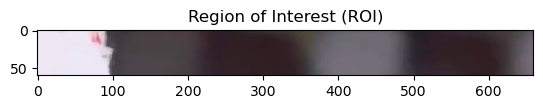


prev name: kamitalicwink new name :  sim score : 0.0


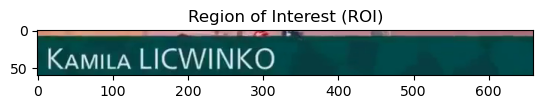

sseekamitalicwinko
prev name: kamitalicwink new name : sseekamitalicwinko sim score : 0.7222222222222222
79 minutes and 51 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/48_Women's_High_Jump_Final_Tokyo_Replays.mp4
4765
4791
Moviepy - Building video ExtractedVideos/48_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 48_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/48_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/48_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '79 minutes and 25 seconds'}


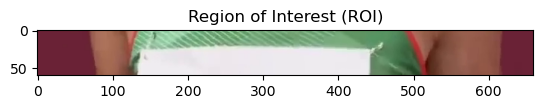

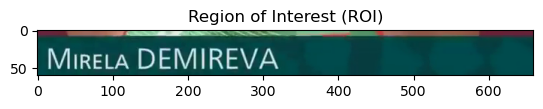

miretademireva
80 minutes and 22 seconds  jump started


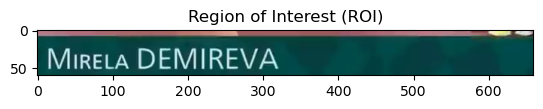

miretademireva
prev name: miretademireva new name : miretademireva sim score : 1.0
80 minutes and 57 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/49_Women's_High_Jump_Final_Tokyo_Replays.mp4
4822
4857
Moviepy - Building video ExtractedVideos/49_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 49_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/49_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/49_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '80 minutes and 22 seconds'}


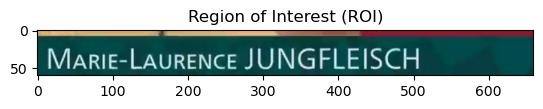

marielaurrencejungfleisch
81 minutes and 12 seconds  jump started


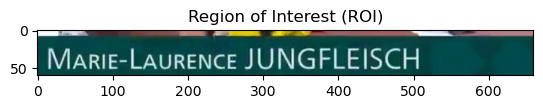

marielaurencejungfleisch
prev name: marielaurrencejungfleisch new name : marielaurencejungfleisch sim score : 0.96
81 minutes and 51 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/50_Women's_High_Jump_Final_Tokyo_Replays.mp4
4872
4911
Moviepy - Building video ExtractedVideos/50_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 50_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/50_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/50_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '81 minutes and 12 seconds'}


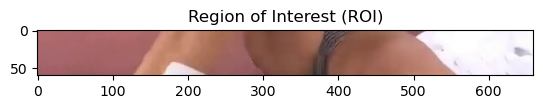

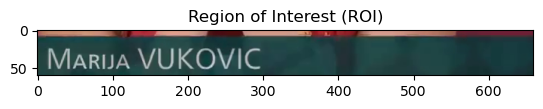

maryavukovic
82 minutes and 11 seconds  jump started


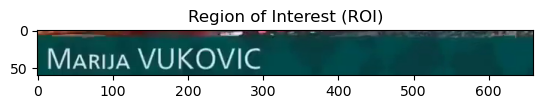

marvavukovic
prev name: maryavukovic new name : marvavukovic sim score : 0.9166666666666666
82 minutes and 50 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/51_Women's_High_Jump_Final_Tokyo_Replays.mp4
4931
4970
Moviepy - Building video ExtractedVideos/51_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 51_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/51_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/51_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '82 minutes and 11 seconds'}


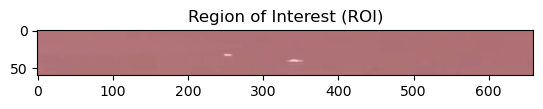

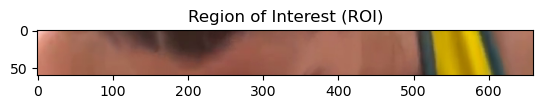

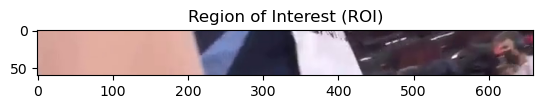

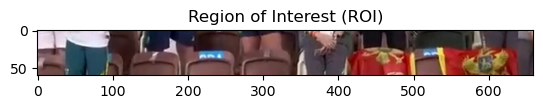

soeidcoesve
85 minutes and 20 seconds  jump started


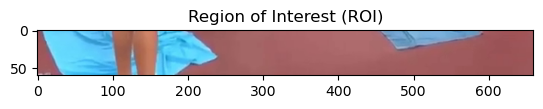


prev name: soeidcoesve new name :  sim score : 0.0


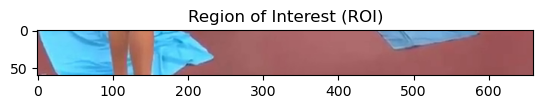


prev name: soeidcoesve new name :  sim score : 0.0


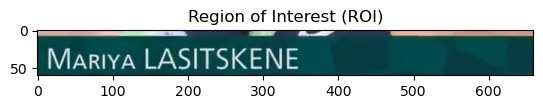

mariyalasitskene
prev name: soeidcoesve new name : mariyalasitskene sim score : 0.1875
similarity score < 0.5 assuming this as start name of jumper : mariyalasitskene time : 86 minutes and 38 seconds
86 minutes and 38 seconds  jump started


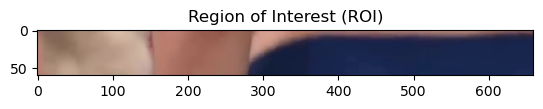


prev name: mariyalasitskene new name :  sim score : 0.0


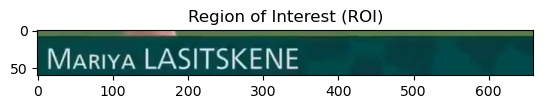

marivalasitskene
prev name: mariyalasitskene new name : marivalasitskene sim score : 0.9375
87 minutes and 26 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/52_Women's_High_Jump_Final_Tokyo_Replays.mp4
5198
5246
Moviepy - Building video ExtractedVideos/52_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 52_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/52_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/52_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '86 minutes and 38 seconds'}


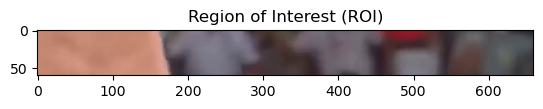

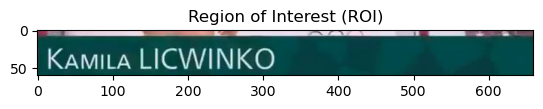

kamitalicwinko
88 minutes and 9 seconds  jump started


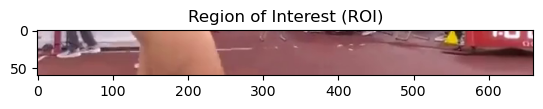

elaes
prev name: kamitalicwinko new name : elaes sim score : 0.0714285714285714


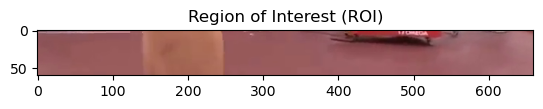


prev name: kamitalicwinko new name :  sim score : 0.0


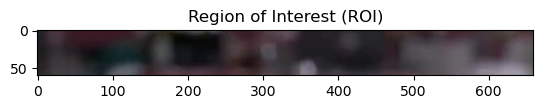


prev name: kamitalicwinko new name :  sim score : 0.0


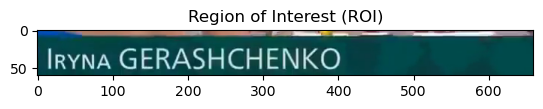

irynagerashchenko
prev name: kamitalicwinko new name : irynagerashchenko sim score : 0.3529411764705882
similarity score < 0.5 assuming this as start name of jumper : irynagerashchenko time : 89 minutes and 41 seconds
89 minutes and 41 seconds  jump started


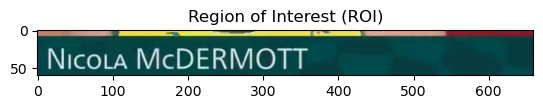

nicotamcdermott
prev name: irynagerashchenko new name : nicotamcdermott sim score : 0.17647058823529416
similarity score < 0.5 assuming this as start name of jumper : nicotamcdermott time : 89 minutes and 57 seconds
89 minutes and 57 seconds  jump started


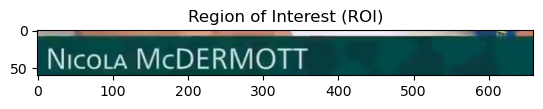

nicotamcdermott
prev name: nicotamcdermott new name : nicotamcdermott sim score : 1.0
90 minutes and 57 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/53_Women's_High_Jump_Final_Tokyo_Replays.mp4
5397
5457
Moviepy - Building video ExtractedVideos/53_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 53_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/53_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/53_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '89 minutes and 57 seconds'}


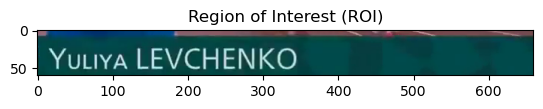

yutiyalevchenko
91 minutes and 49 seconds  jump started


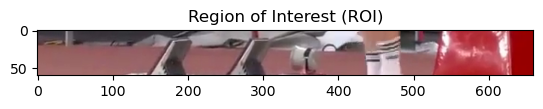


prev name: yutiyalevchenko new name :  sim score : 0.0


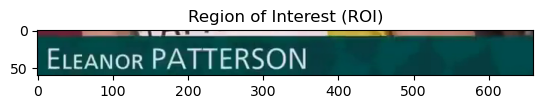

eleanorpatterson
prev name: yutiyalevchenko new name : eleanorpatterson sim score : 0.125
similarity score < 0.5 assuming this as start name of jumper : eleanorpatterson time : 92 minutes and 3 seconds
92 minutes and 3 seconds  jump started


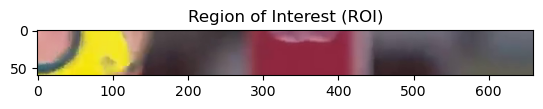


prev name: eleanorpatterson new name :  sim score : 0.0


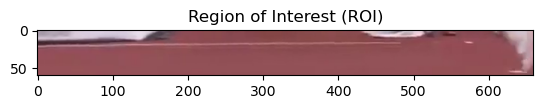


prev name: eleanorpatterson new name :  sim score : 0.0


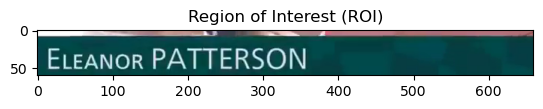

eleanorpatterson
prev name: eleanorpatterson new name : eleanorpatterson sim score : 1.0
92 minutes and 46 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/54_Women's_High_Jump_Final_Tokyo_Replays.mp4
5523
5566
Moviepy - Building video ExtractedVideos/54_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 54_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/54_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/54_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '92 minutes and 3 seconds'}


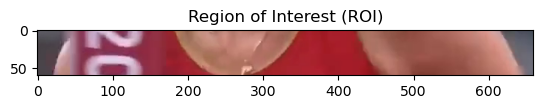

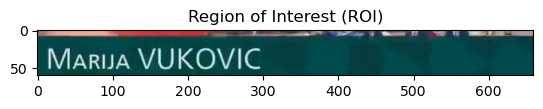

eeesoeemaruavukovic
93 minutes and 36 seconds  jump started


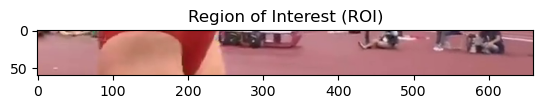

rseh
prev name: eeesoeemaruavukovic new name : rseh sim score : 0.10526315789473684


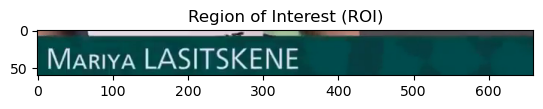

mariyalasitskene
prev name: eeesoeemaruavukovic new name : mariyalasitskene sim score : 0.10526315789473684
similarity score < 0.5 assuming this as start name of jumper : mariyalasitskene time : 93 minutes and 49 seconds
93 minutes and 49 seconds  jump started


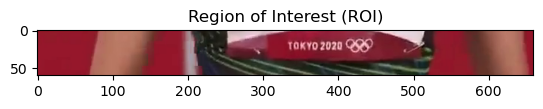

sssas
prev name: mariyalasitskene new name : sssas sim score : 0.125


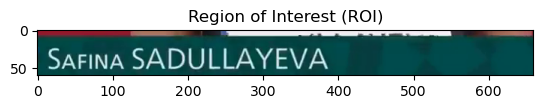

safinasadullayeva
prev name: mariyalasitskene new name : safinasadullayeva sim score : 0.2941176470588235
similarity score < 0.5 assuming this as start name of jumper : safinasadullayeva time : 95 minutes and 11 seconds
95 minutes and 11 seconds  jump started


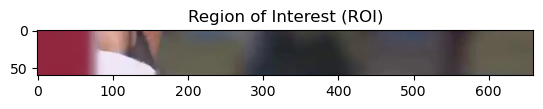


prev name: safinasadullayeva new name :  sim score : 0.0


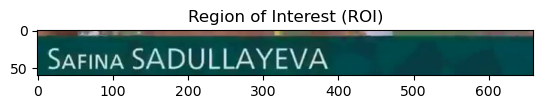

safinasadullayeva
prev name: safinasadullayeva new name : safinasadullayeva sim score : 1.0
95 minutes and 58 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/55_Women's_High_Jump_Final_Tokyo_Replays.mp4
5711
5758
Moviepy - Building video ExtractedVideos/55_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 55_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/55_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/55_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '95 minutes and 11 seconds'}


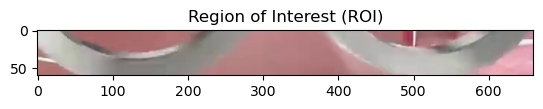

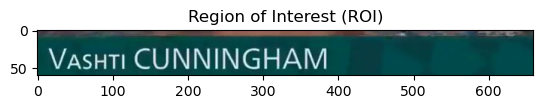

vasuttcunningham
97 minutes and 33 seconds  jump started


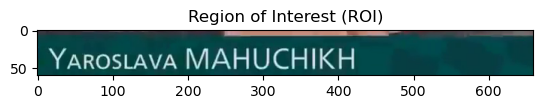

yarostavamahuchikh
prev name: vasuttcunningham new name : yarostavamahuchikh sim score : 0.16666666666666663
similarity score < 0.5 assuming this as start name of jumper : yarostavamahuchikh time : 98 minutes and 14 seconds
98 minutes and 14 seconds  jump started


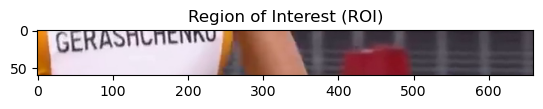

vayhf
prev name: yarostavamahuchikh new name : vayhf sim score : 0.16666666666666663


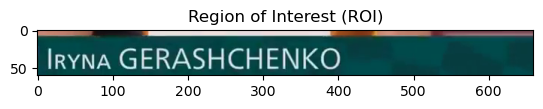

irrynagerashchenko
prev name: yarostavamahuchikh new name : irrynagerashchenko sim score : 0.2777777777777778
similarity score < 0.5 assuming this as start name of jumper : irrynagerashchenko time : 99 minutes and 4 seconds
99 minutes and 4 seconds  jump started


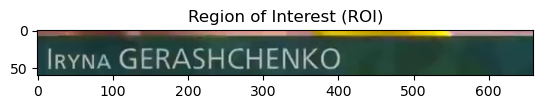

irynagerashchenko
prev name: irrynagerashchenko new name : irynagerashchenko sim score : 0.9444444444444444
99 minutes and 42 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/56_Women's_High_Jump_Final_Tokyo_Replays.mp4
5944
5982
Moviepy - Building video ExtractedVideos/56_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 56_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/56_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/56_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '99 minutes and 4 seconds'}


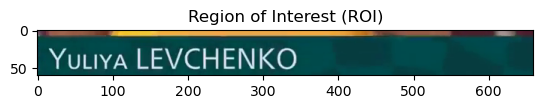

yutiyvalevchenko
100 minutes and 2 seconds  jump started


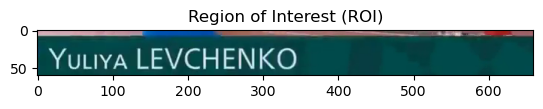

yutiyvalevchenko
prev name: yutiyvalevchenko new name : yutiyvalevchenko sim score : 1.0
100 minutes and 39 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/57_Women's_High_Jump_Final_Tokyo_Replays.mp4
6002
6039
Moviepy - Building video ExtractedVideos/57_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 57_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/57_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/57_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '100 minutes and 2 seconds'}


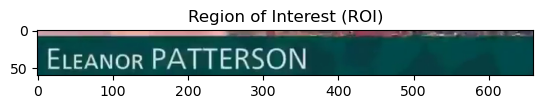

eleanorpatterson
101 minutes and 36 seconds  jump started


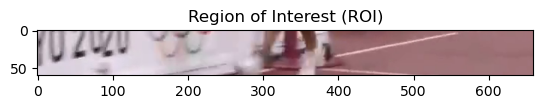


prev name: eleanorpatterson new name :  sim score : 0.0


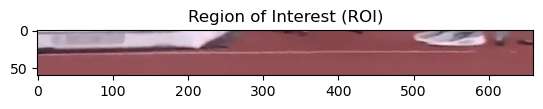


prev name: eleanorpatterson new name :  sim score : 0.0


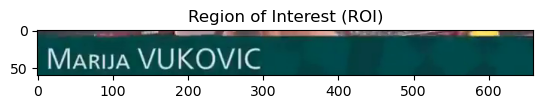

eeemaruavukovic
prev name: eleanorpatterson new name : eeemaruavukovic sim score : 0.25
similarity score < 0.5 assuming this as start name of jumper : eeemaruavukovic time : 102 minutes and 41 seconds
102 minutes and 41 seconds  jump started


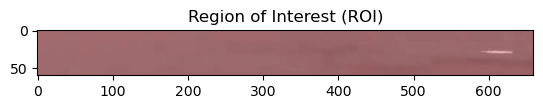


prev name: eeemaruavukovic new name :  sim score : 0.0


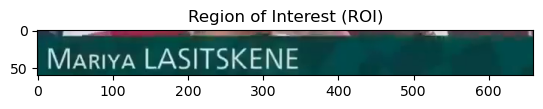

eeeeyieeeemariyalasitskene
prev name: eeemaruavukovic new name : eeeeyieeeemariyalasitskene sim score : 0.2692307692307693
similarity score < 0.5 assuming this as start name of jumper : eeeeyieeeemariyalasitskene time : 103 minutes and 44 seconds
103 minutes and 44 seconds  jump started


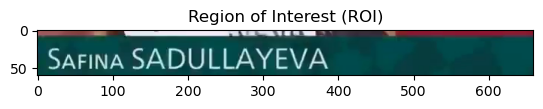

safinasadullayeva
prev name: eeeeyieeeemariyalasitskene new name : safinasadullayeva sim score : 0.1923076923076923
similarity score < 0.5 assuming this as start name of jumper : safinasadullayeva time : 104 minutes and 4 seconds
104 minutes and 4 seconds  jump started


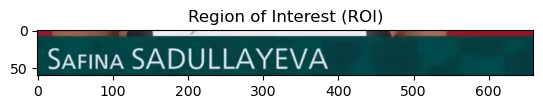

safinasadullayeva
prev name: safinasadullayeva new name : safinasadullayeva sim score : 1.0
104 minutes and 12 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/58_Women's_High_Jump_Final_Tokyo_Replays.mp4
6244
6252
Moviepy - Building video ExtractedVideos/58_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 58_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/58_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/58_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '104 minutes and 4 seconds'}


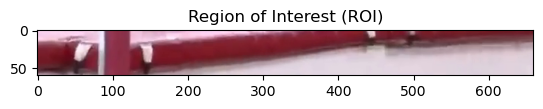

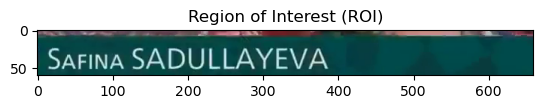

ereresadullayeva
104 minutes and 44 seconds  jump started


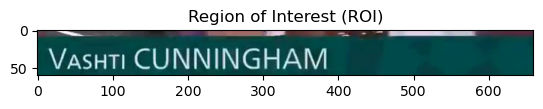

vasuticunningham
prev name: ereresadullayeva new name : vasuticunningham sim score : 0.0625
similarity score < 0.5 assuming this as start name of jumper : vasuticunningham time : 105 minutes and 46 seconds
105 minutes and 46 seconds  jump started


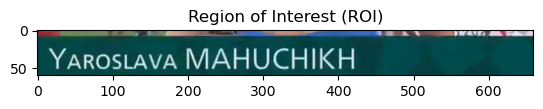

eseeeeeyarostavaamahuchikh
prev name: vasuticunningham new name : eseeeeeyarostavaamahuchikh sim score : 0.11538461538461542
similarity score < 0.5 assuming this as start name of jumper : eseeeeeyarostavaamahuchikh time : 106 minutes and 26 seconds
106 minutes and 26 seconds  jump started


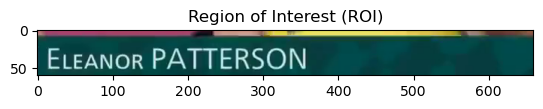

eleanorpatterson
prev name: eseeeeeyarostavaamahuchikh new name : eleanorpatterson sim score : 0.1923076923076923
similarity score < 0.5 assuming this as start name of jumper : eleanorpatterson time : 107 minutes and 13 seconds
107 minutes and 13 seconds  jump started


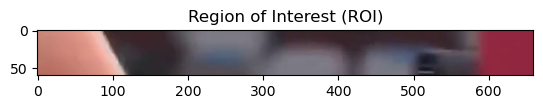


prev name: eleanorpatterson new name :  sim score : 0.0


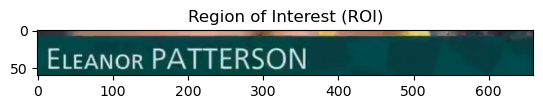

eleanorpatterson
prev name: eleanorpatterson new name : eleanorpatterson sim score : 1.0
107 minutes and 40 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/59_Women's_High_Jump_Final_Tokyo_Replays.mp4
6433
6460
Moviepy - Building video ExtractedVideos/59_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 59_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/59_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/59_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '107 minutes and 13 seconds'}


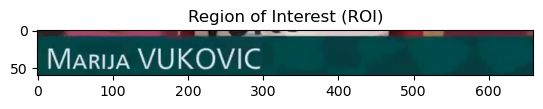

maruavukovic
108 minutes and 2 seconds  jump started


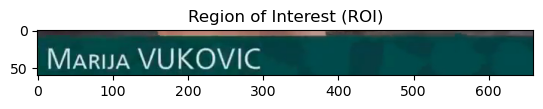

maruavukovic
prev name: maruavukovic new name : maruavukovic sim score : 1.0
108 minutes and 41 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/60_Women's_High_Jump_Final_Tokyo_Replays.mp4
6482
6521
Moviepy - Building video ExtractedVideos/60_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 60_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/60_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/60_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '108 minutes and 2 seconds'}


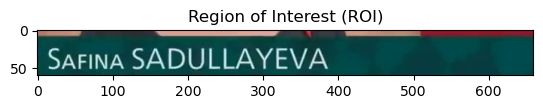

safinasadullayeva
109 minutes and 25 seconds  jump started


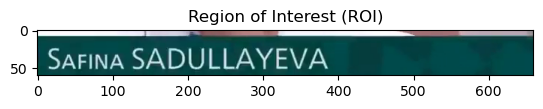

safinasadullayeva
prev name: safinasadullayeva new name : safinasadullayeva sim score : 1.0
109 minutes and 57 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/61_Women's_High_Jump_Final_Tokyo_Replays.mp4
6565
6597
Moviepy - Building video ExtractedVideos/61_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 61_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/61_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/61_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '109 minutes and 25 seconds'}


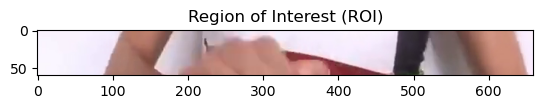

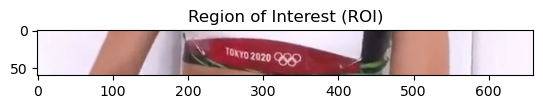

clttaeeft
110 minutes and 14 seconds  jump started


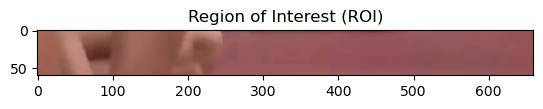


prev name: clttaeeft new name :  sim score : 0.0


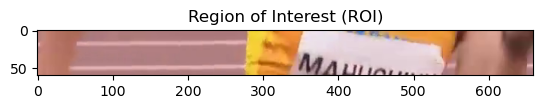


prev name: clttaeeft new name :  sim score : 0.0


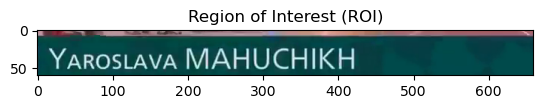

osyarostavamahuchikh
prev name: clttaeeft new name : osyarostavamahuchikh sim score : 0.09999999999999998
similarity score < 0.5 assuming this as start name of jumper : osyarostavamahuchikh time : 111 minutes and 20 seconds
111 minutes and 20 seconds  jump started


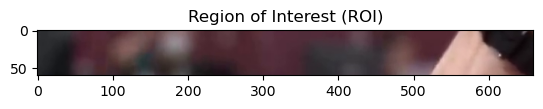


prev name: osyarostavamahuchikh new name :  sim score : 0.0


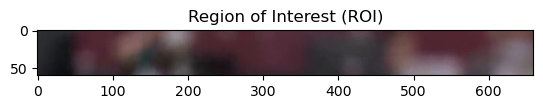


prev name: osyarostavamahuchikh new name :  sim score : 0.0


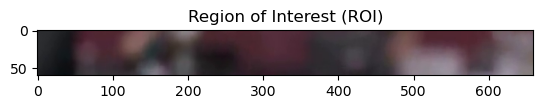


prev name: osyarostavamahuchikh new name :  sim score : 0.0


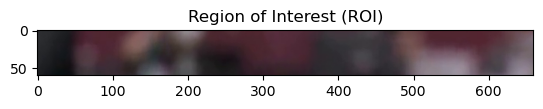


prev name: osyarostavamahuchikh new name :  sim score : 0.0


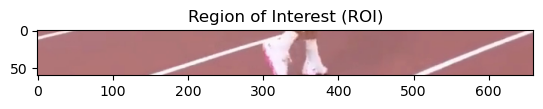


prev name: osyarostavamahuchikh new name :  sim score : 0.0


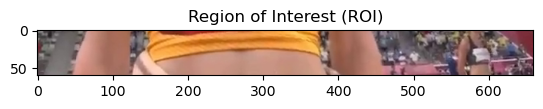


prev name: osyarostavamahuchikh new name :  sim score : 0.0


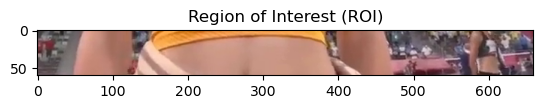


prev name: osyarostavamahuchikh new name :  sim score : 0.0


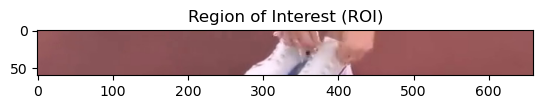


prev name: osyarostavamahuchikh new name :  sim score : 0.0


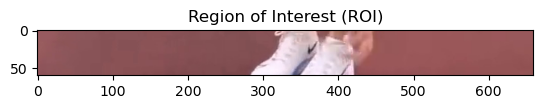


prev name: osyarostavamahuchikh new name :  sim score : 0.0


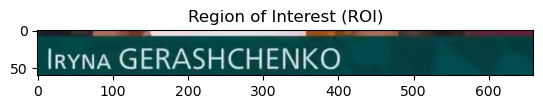

beegerashchenko
prev name: osyarostavamahuchikh new name : beegerashchenko sim score : 0.19999999999999996
similarity score < 0.5 assuming this as start name of jumper : beegerashchenko time : 114 minutes and 18 seconds
114 minutes and 18 seconds  jump started


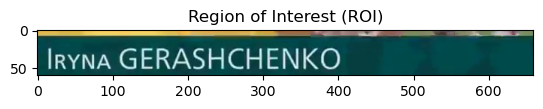

iryynagerashchenko
prev name: beegerashchenko new name : iryynagerashchenko sim score : 0.6666666666666667
114 minutes and 57 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/62_Women's_High_Jump_Final_Tokyo_Replays.mp4
6858
6897
Moviepy - Building video ExtractedVideos/62_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 62_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/62_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/62_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '114 minutes and 18 seconds'}


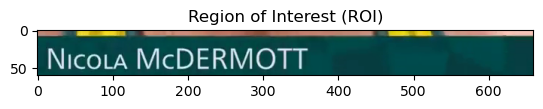

nicotamcdermott
115 minutes and 36 seconds  jump started


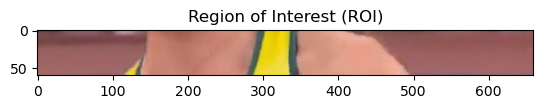


prev name: nicotamcdermott new name :  sim score : 0.0


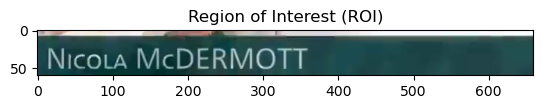

nicotamcdermott
prev name: nicotamcdermott new name : nicotamcdermott sim score : 1.0
116 minutes and 8 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/63_Women's_High_Jump_Final_Tokyo_Replays.mp4
6936
6968
Moviepy - Building video ExtractedVideos/63_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 63_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/63_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/63_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '115 minutes and 36 seconds'}


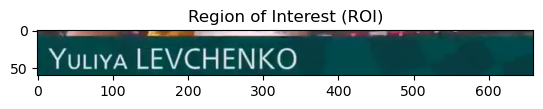

yuuivalevchenko
117 minutes and 18 seconds  jump started


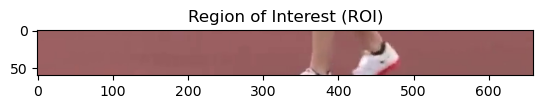


prev name: yuuivalevchenko new name :  sim score : 0.0


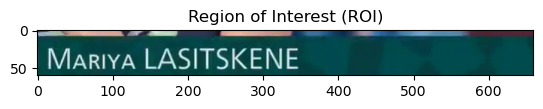

mariyalasitskene
prev name: yuuivalevchenko new name : mariyalasitskene sim score : 0.25
similarity score < 0.5 assuming this as start name of jumper : mariyalasitskene time : 117 minutes and 34 seconds
117 minutes and 34 seconds  jump started


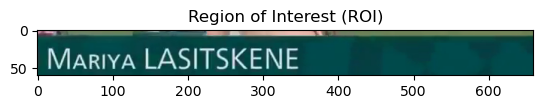

mariyalasitskene
prev name: mariyalasitskene new name : mariyalasitskene sim score : 1.0
118 minutes and 26 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/64_Women's_High_Jump_Final_Tokyo_Replays.mp4
7054
7106
Moviepy - Building video ExtractedVideos/64_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 64_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/64_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/64_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '117 minutes and 34 seconds'}


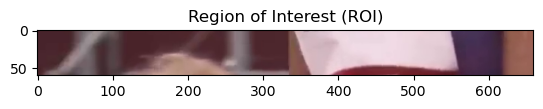

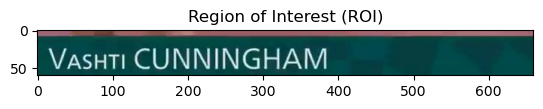

vasuticunningham
119 minutes and 56 seconds  jump started


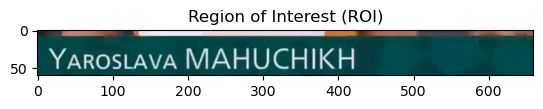

yarostaavamahuchikh
prev name: vasuticunningham new name : yarostaavamahuchikh sim score : 0.1578947368421053
similarity score < 0.5 assuming this as start name of jumper : yarostaavamahuchikh time : 120 minutes and 7 seconds
120 minutes and 7 seconds  jump started


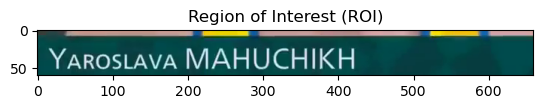

yarostavamahuchikh
prev name: yarostaavamahuchikh new name : yarostavamahuchikh sim score : 0.9473684210526316
120 minutes and 29 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/65_Women's_High_Jump_Final_Tokyo_Replays.mp4
7207
7229
Moviepy - Building video ExtractedVideos/65_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 65_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/65_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/65_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '120 minutes and 7 seconds'}


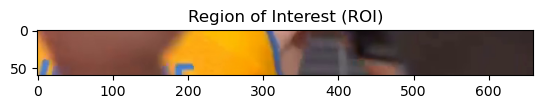

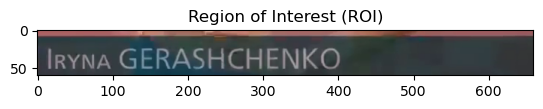

irynagerashchenko
125 minutes and 20 seconds  jump started


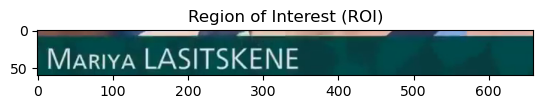

mariyalasitskene
prev name: irynagerashchenko new name : mariyalasitskene sim score : 0.23529411764705888
similarity score < 0.5 assuming this as start name of jumper : mariyalasitskene time : 125 minutes and 54 seconds
125 minutes and 54 seconds  jump started


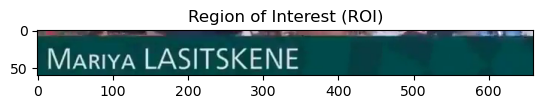

sswreneemariyalasitskene
prev name: mariyalasitskene new name : sswreneemariyalasitskene sim score : 0.6666666666666667
126 minutes and 36 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/66_Women's_High_Jump_Final_Tokyo_Replays.mp4
7554
7596
Moviepy - Building video ExtractedVideos/66_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 66_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/66_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/66_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '125 minutes and 54 seconds'}


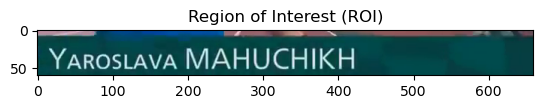

yarostavamahuchikh
127 minutes and 20 seconds  jump started


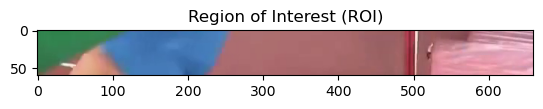


prev name: yarostavamahuchikh new name :  sim score : 0.0


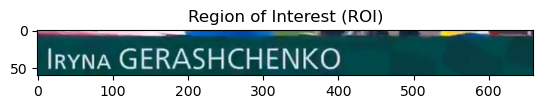

irrynagerashchenko
prev name: yarostavamahuchikh new name : irrynagerashchenko sim score : 0.2777777777777778
similarity score < 0.5 assuming this as start name of jumper : irrynagerashchenko time : 128 minutes and 23 seconds
128 minutes and 23 seconds  jump started


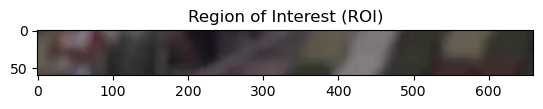


prev name: irrynagerashchenko new name :  sim score : 0.0


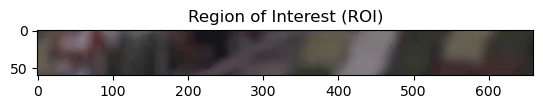


prev name: irrynagerashchenko new name :  sim score : 0.0


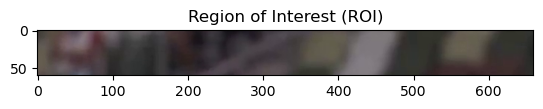


prev name: irrynagerashchenko new name :  sim score : 0.0


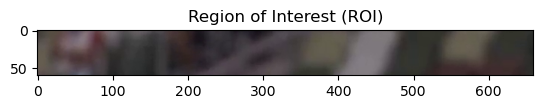


prev name: irrynagerashchenko new name :  sim score : 0.0


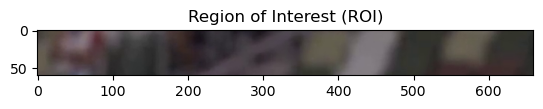


prev name: irrynagerashchenko new name :  sim score : 0.0


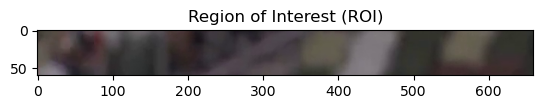


prev name: irrynagerashchenko new name :  sim score : 0.0


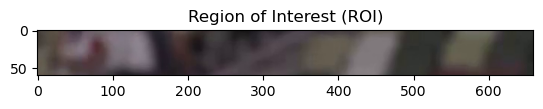


prev name: irrynagerashchenko new name :  sim score : 0.0


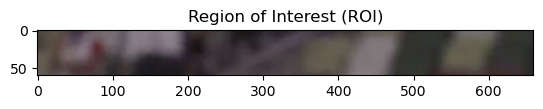


prev name: irrynagerashchenko new name :  sim score : 0.0


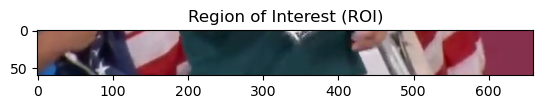


prev name: irrynagerashchenko new name :  sim score : 0.0


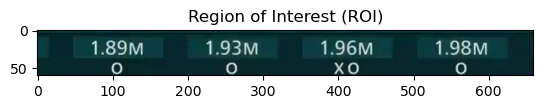

mmmmrerexore
prev name: irrynagerashchenko new name : mmmmrerexore sim score : 0.16666666666666663
similarity score < 0.5 assuming this as start name of jumper : mmmmrerexore time : 130 minutes and 3 seconds
130 minutes and 3 seconds  jump started


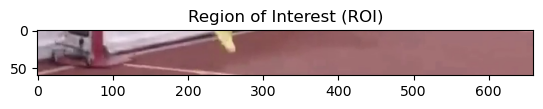


prev name: mmmmrerexore new name :  sim score : 0.0


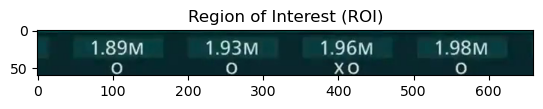

mmmmrerexore
prev name: mmmmrerexore new name : mmmmrerexore sim score : 1.0
130 minutes and 30 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/67_Women's_High_Jump_Final_Tokyo_Replays.mp4
7803
7830
Moviepy - Building video ExtractedVideos/67_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 67_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/67_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/67_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '130 minutes and 3 seconds'}


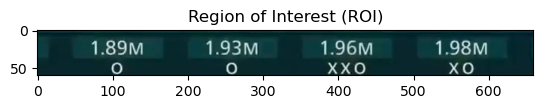

mmmmrerexxxoooxo
131 minutes and 48 seconds  jump started


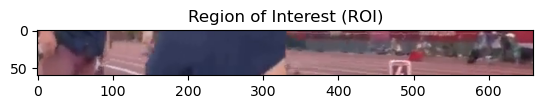


prev name: mmmmrerexxxoooxo new name :  sim score : 0.0


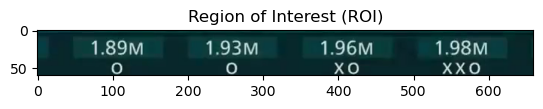

mmmmrerexoxxo
prev name: mmmmrerexxxoooxo new name : mmmmrerexoxxo sim score : 0.75
132 minutes and 4 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/68_Women's_High_Jump_Final_Tokyo_Replays.mp4
7908
7924
Moviepy - Building video ExtractedVideos/68_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 68_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/68_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/68_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '131 minutes and 48 seconds'}


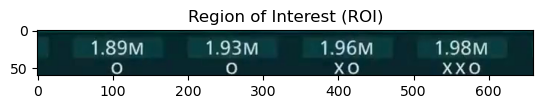

mmmmrerexoxxxooo
132 minutes and 26 seconds  jump started


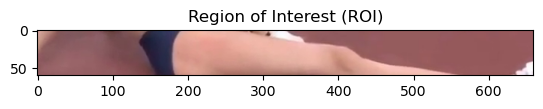


prev name: mmmmrerexoxxxooo new name :  sim score : 0.0


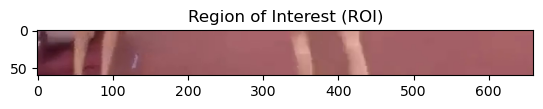


prev name: mmmmrerexoxxxooo new name :  sim score : 0.0


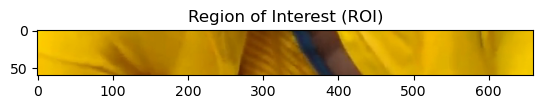


prev name: mmmmrerexoxxxooo new name :  sim score : 0.0


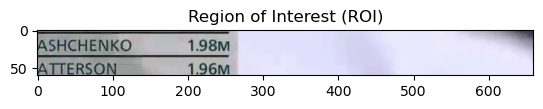

ashchenkomattersonm
prev name: mmmmrerexoxxxooo new name : ashchenkomattersonm sim score : 0.10526315789473684
similarity score < 0.5 assuming this as start name of jumper : ashchenkomattersonm time : 135 minutes and 43 seconds
135 minutes and 43 seconds  jump started


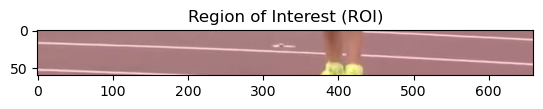


prev name: ashchenkomattersonm new name :  sim score : 0.0


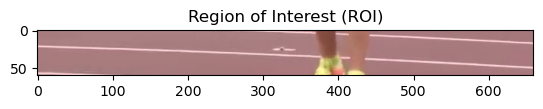


prev name: ashchenkomattersonm new name :  sim score : 0.0


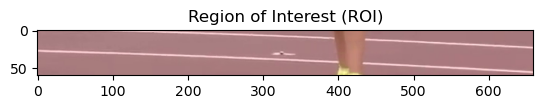


prev name: ashchenkomattersonm new name :  sim score : 0.0


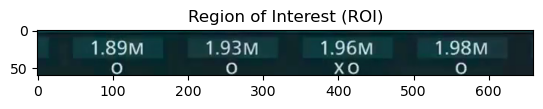

mmmmrerexore
prev name: ashchenkomattersonm new name : mmmmrerexore sim score : 0.1578947368421053
similarity score < 0.5 assuming this as start name of jumper : mmmmrerexore time : 137 minutes and 43 seconds
137 minutes and 43 seconds  jump started


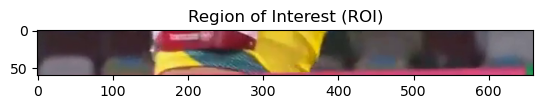


prev name: mmmmrerexore new name :  sim score : 0.0


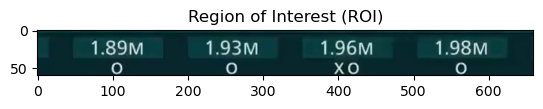

mmmmrerexore
prev name: mmmmrerexore new name : mmmmrerexore sim score : 1.0
138 minutes and 18 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/69_Women's_High_Jump_Final_Tokyo_Replays.mp4
8263
8298
Moviepy - Building video ExtractedVideos/69_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 69_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/69_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/69_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '137 minutes and 43 seconds'}


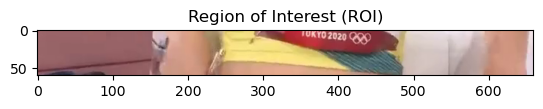

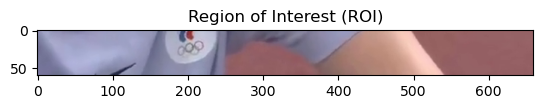

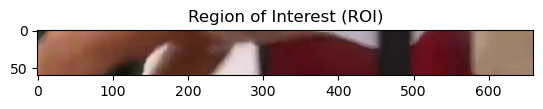

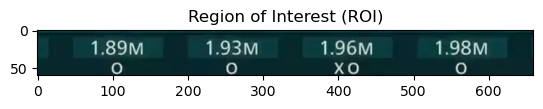

mmmmrerexore
141 minutes and 23 seconds  jump started


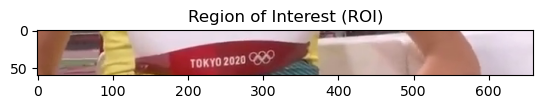

tokyo
prev name: mmmmrerexore new name : tokyo sim score : 0.08333333333333337


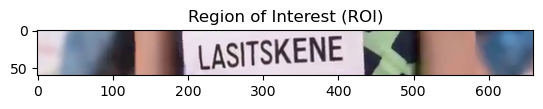

troblasitskeneso
prev name: mmmmrerexore new name : troblasitskeneso sim score : 0.0625
similarity score < 0.5 assuming this as start name of jumper : troblasitskeneso time : 141 minutes and 51 seconds
141 minutes and 51 seconds  jump started


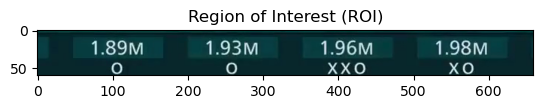

mmmmrerexxxxoxo
prev name: troblasitskeneso new name : mmmmrerexxxxoxo sim score : 0.0625
similarity score < 0.5 assuming this as start name of jumper : mmmmrerexxxxoxo time : 142 minutes and 0 seconds
142 minutes and 0 seconds  jump started


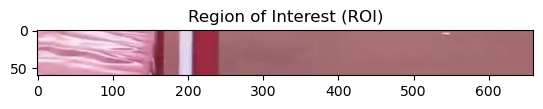


prev name: mmmmrerexxxxoxo new name :  sim score : 0.0


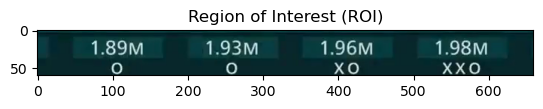

mmmmrerexoxxo
prev name: mmmmrerexxxxoxo new name : mmmmrerexoxxo sim score : 0.8
142 minutes and 54 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/70_Women's_High_Jump_Final_Tokyo_Replays.mp4
8520
8574
Moviepy - Building video ExtractedVideos/70_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 70_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/70_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/70_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '142 minutes and 0 seconds'}


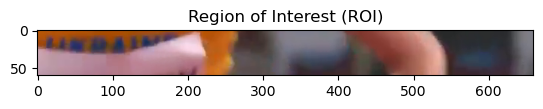

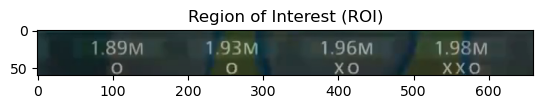

mmmmreooxoxxxxo
143 minutes and 13 seconds  jump started


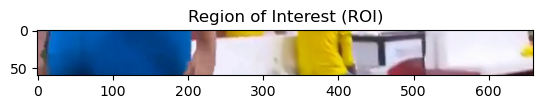


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


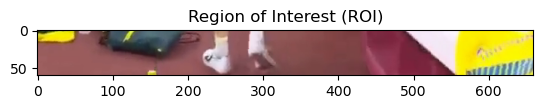


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


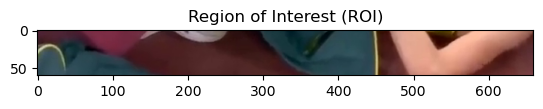


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


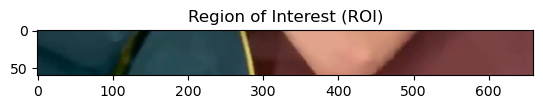


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


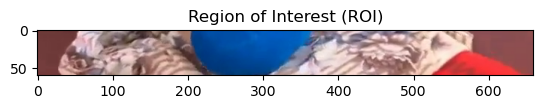

beaae
prev name: mmmmreooxoxxxxo new name : beaae sim score : 0.06666666666666665


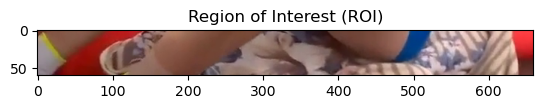


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


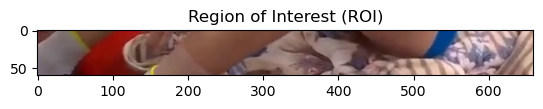


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


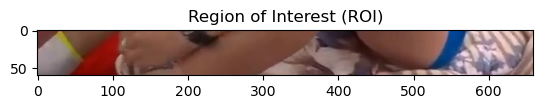


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


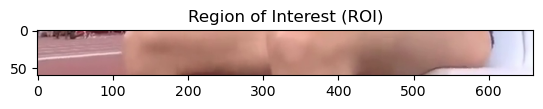


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


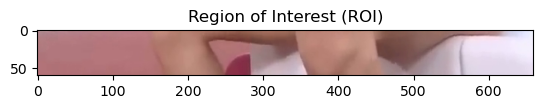


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


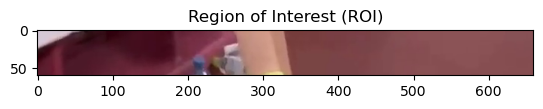


prev name: mmmmreooxoxxxxo new name :  sim score : 0.0


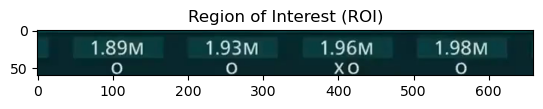

mmmmrerexore
prev name: mmmmreooxoxxxxo new name : mmmmrerexore sim score : 0.5333333333333333
149 minutes and 20 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/71_Women's_High_Jump_Final_Tokyo_Replays.mp4
8593
8960
Moviepy - Building video ExtractedVideos/71_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 71_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/71_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/71_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '143 minutes and 13 seconds'}


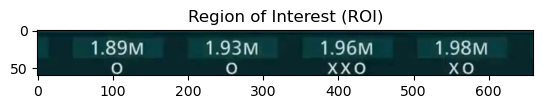

mmmmreooxxxxoxo
149 minutes and 51 seconds  jump started


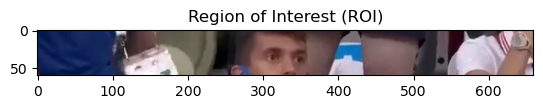


prev name: mmmmreooxxxxoxo new name :  sim score : 0.0


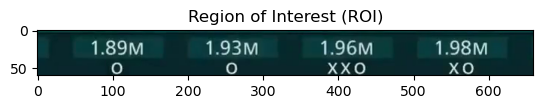

mmmmrerexxoxo
prev name: mmmmreooxxxxoxo new name : mmmmrerexxoxo sim score : 0.7333333333333334
150 minutes and 52 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/72_Women's_High_Jump_Final_Tokyo_Replays.mp4
8991
9052
Moviepy - Building video ExtractedVideos/72_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 72_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/72_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/72_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '149 minutes and 51 seconds'}


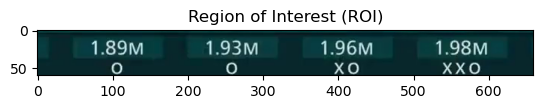

mmmmrerexoxxxxo
151 minutes and 14 seconds  jump started


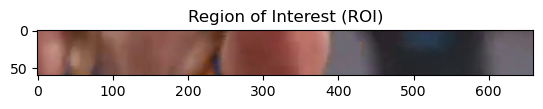


prev name: mmmmrerexoxxxxo new name :  sim score : 0.0


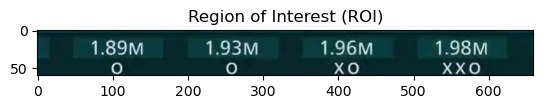

mmmmrerexoxxo
prev name: mmmmrerexoxxxxo new name : mmmmrerexoxxo sim score : 0.8666666666666667
151 minutes and 52 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/73_Women's_High_Jump_Final_Tokyo_Replays.mp4
9074
9112
Moviepy - Building video ExtractedVideos/73_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 73_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/73_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/73_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '151 minutes and 14 seconds'}


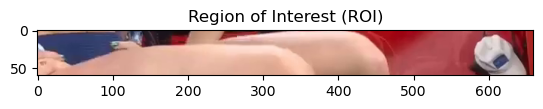

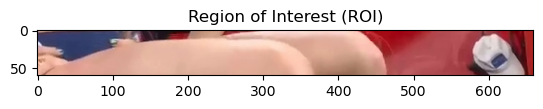

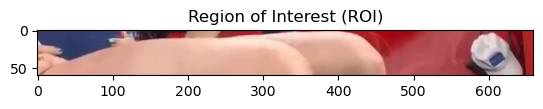

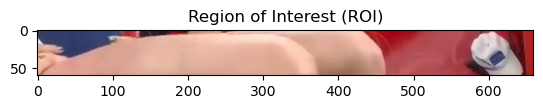

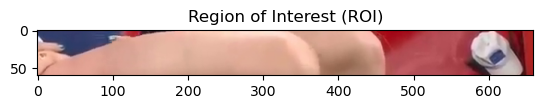

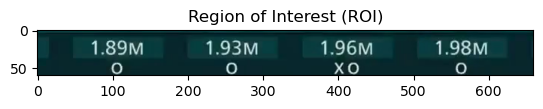

mmmmrerexore
152 minutes and 44 seconds  jump started


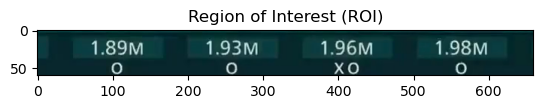

mmmmrerexore
prev name: mmmmrerexore new name : mmmmrerexore sim score : 1.0
153 minutes and 25 seconds  jump scores announced
HighJumpVideo/final_video.mp4
ExtractedVideos/74_Women's_High_Jump_Final_Tokyo_Replays.mp4
9164
9205
Moviepy - Building video ExtractedVideos/74_Women's_High_Jump_Final_Tokyo_Replays.mp4.
MoviePy - Writing audio in 74_Women's_High_Jump_Final_Tokyo_ReplaysTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ExtractedVideos/74_Women's_High_Jump_Final_Tokyo_Replays.mp4



Moviepy - Done !
Moviepy - video ready ExtractedVideos/74_Women's_High_Jump_Final_Tokyo_Replays.mp4
{'Time': '152 minutes and 44 seconds'}


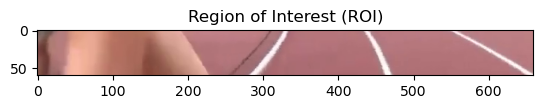

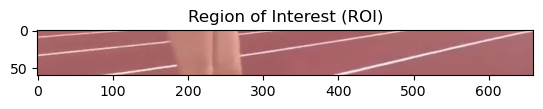

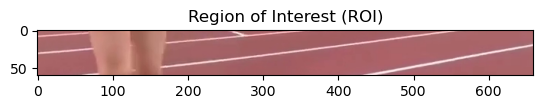

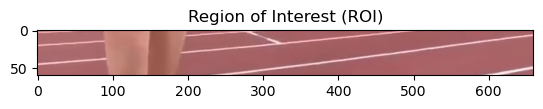

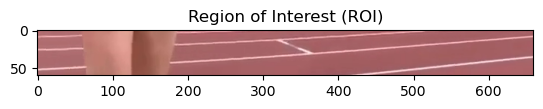

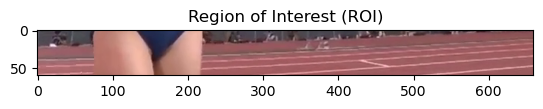

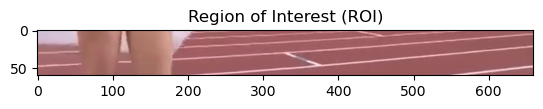

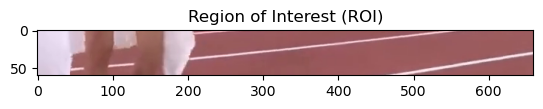

In [ ]:
templateLondon = cv2.imread('helperImages/template1.jpg', cv2.IMREAD_GRAYSCALE)
template1 = cv2.imread('helperImages/template2.jpg', cv2.IMREAD_GRAYSCALE)
template2 = cv2.imread('helperImages/template3.jpeg', cv2.IMREAD_GRAYSCALE)
template3 = cv2.imread('helperImages/template4.jpeg', cv2.IMREAD_GRAYSCALE)
template4 = cv2.imread('helperImages/template5.png', cv2.IMREAD_GRAYSCALE)
extract_from_video("HighJumpVideo/final_video.mp4","Women's_High_Jump_Final_Tokyo_Replays",templateLondon,template1 , template2 , template3 , template4)